In [1]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
from keras import Model
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.preprocessing.image import load_img,img_to_array
from keras.layers import GlobalMaxPooling2D
tf.__version__

'2.15.0'

In [2]:
imgs_path = "datathon/"
img_width, img_height = 224, 224
files = [imgs_path + x for x in os.listdir(imgs_path) if x.endswith((".jpg", ".png"))]
print("Total number of images in dataset:",len(files))

Total number of images in dataset: 981


In [3]:
imgs_path = "datathon/"
img_width, img_height = 224, 224
files = [imgs_path + x for x in os.listdir(imgs_path) if x.endswith((".jpg", ".png"))]
print("Total number of images in dataset:",len(files))

Total number of images in dataset: 981


In [4]:
base_model = ResNet50(weights='imagenet', 
                      include_top=False, 
                      input_shape = (img_width, img_height, 3))
base_model.trainable = False

# Add Layer Embedding
model = keras.Sequential([
    base_model,
    GlobalMaxPooling2D()
])

model.summary()

2023-12-15 01:01:44.862207: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2023-12-15 01:01:44.862232: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2023-12-15 01:01:44.862237: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2023-12-15 01:01:44.862271: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-12-15 01:01:44.862286: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_max_pooling2d (Glob  (None, 2048)              0         
 alMaxPooling2D)                                                 
                                                                 
Total params: 23587712 (89.98 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [5]:
def get_embedding(model, img_path):
    # Reshape
    img = image.load_img(img_path, target_size=(img_width, img_height))
    # img to Array
    x   = image.img_to_array(img)
    # Expand Dim (1, w, h)
    x   = np.expand_dims(x, axis=0)
    # Pre process Input
    x   = preprocess_input(x)
    return model.predict(x).reshape(-1)
features_imgs = []
for filename in files:
    feature_img = get_embedding(model, filename)
    features_imgs.append(feature_img)

2023-12-15 01:01:47.654934: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 28ms/step


# COSINE SIMILARITY

In [6]:
products = pd.DataFrame(features_imgs, index=files)
products_features = np.array(products)

In [7]:
from sklearn.metrics.pairwise import cosine_similarity

cosSimilarities = cosine_similarity(products)
cos_similarities_df = pd.DataFrame(cosSimilarities, index = files, columns = files)
cos_similarities_df.head(10)
def getID(product_path):
    index = product_path.rfind('_')
    index = product_path.rfind('_', 0, index)
    return product_path[:index]
cos_similarities_df
cos_similarities_df.to_csv('cosSimilarities/RESNET50.csv')

In [8]:
def retrieve_most_similar_products(given_img, cos_similarities_df, nb_closest_images):
    print("-----------------------------------------------------------------------")
    product_name = getID(given_img)
    print("original product:", product_name)
    
    original = load_img(given_img, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("-----------------------------------------------------------------------")
    print("most similar products:")
    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+100]
    showed_products = []
    showed_products.append(product_name)
    i = 0
    while(len(showed_products) != nb_closest_images + 1):
        name = getID(closest_imgs[i])
        if name in showed_products:
            i+=1
            continue
        if os.path.exists(name + "_image_1.jpg"):
            filename = name + "_image_1.jpg"
        elif os.path.exists(name + "_image_1.png"):
            filename = name + "_image_1.png"
        else:
            filename = closest_imgs[i]
        original = load_img(filename, target_size=(img_width, img_height))
        plt.imshow(original)
        plt.show()
        print("name: ", name)
        print("similarity score : ",closest_imgs_scores.iloc[i])
        i+=1
        showed_products.append(name)

-----------------------------------------------------------------------
original product: datathon/test


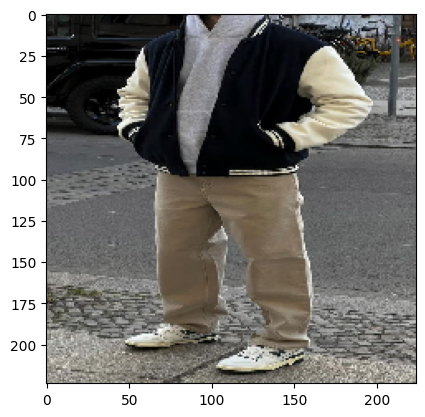

-----------------------------------------------------------------------
most similar products:


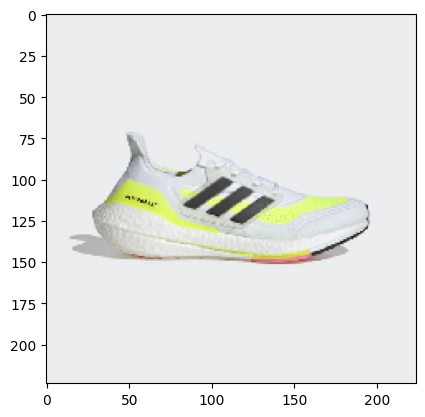

name:  datathon/ultraboost_21_shoes
similarity score :  0.6742365


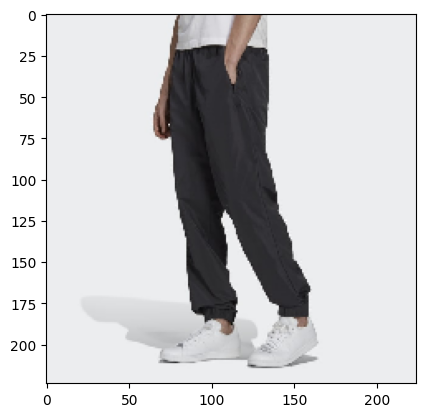

name:  datathon/adicolor_track_pants
similarity score :  0.6686769


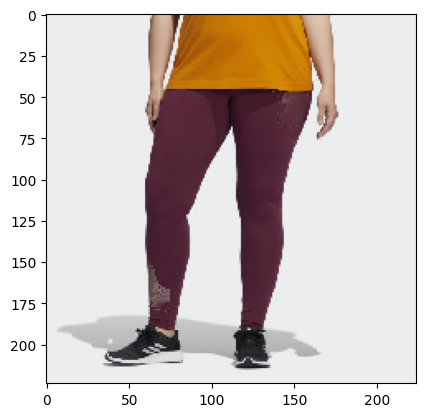

name:  datathon/holiday_graphic_tights_(plus_size)
similarity score :  0.6661856


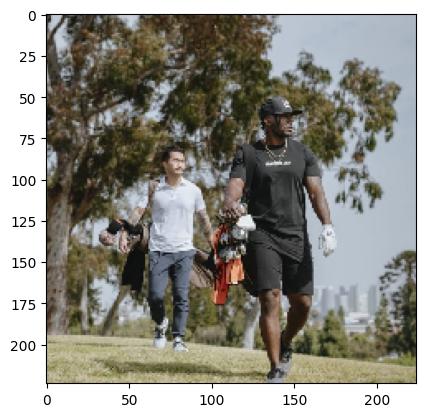

name:  datathon/adicross_hybrid_shorts
similarity score :  0.6647688


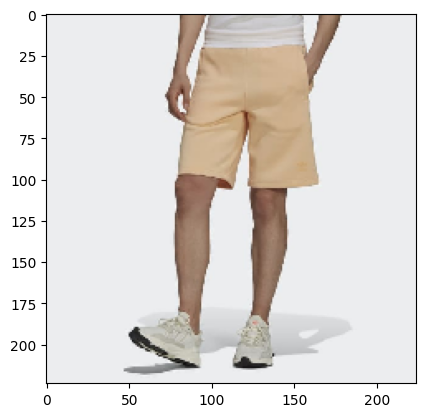

name:  datathon/adicolor_classics_mm_trefoil_shorts
similarity score :  0.6607646


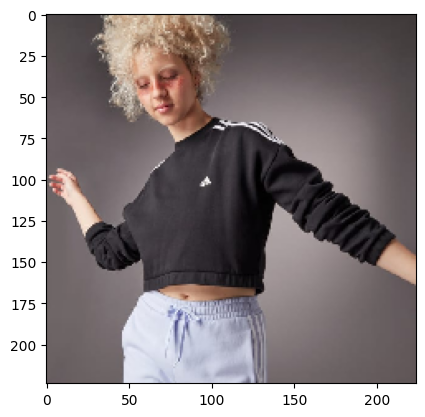

name:  datathon/hyperglam_crop_crew_sweatshirt
similarity score :  0.6512867


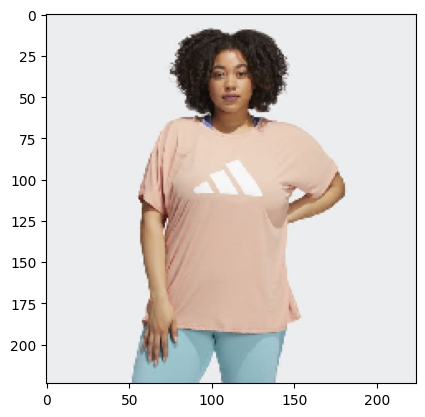

name:  datathon/3-stripes_training_tee_(plus_size)
similarity score :  0.64675784


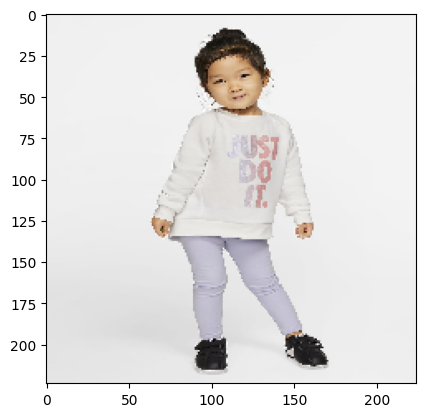

name:  datathon/nike
similarity score :  0.6456547


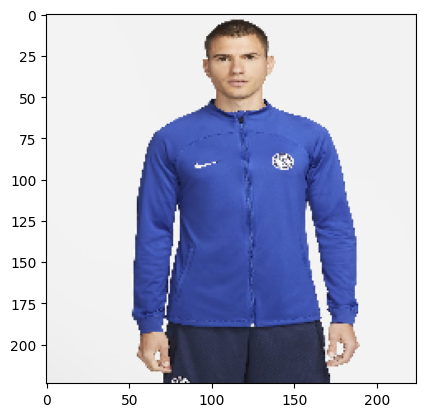

name:  datathon/chelsea_fc_strike
similarity score :  0.64507145


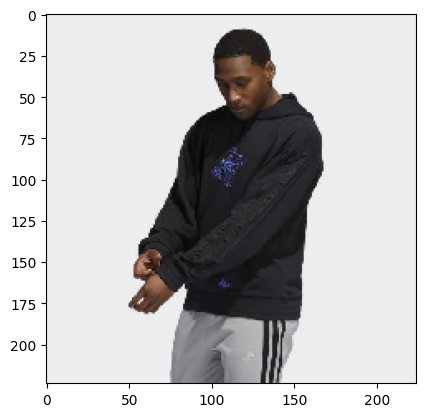

name:  datathon/lil_stripe_ignite_szn_hoodie
similarity score :  0.64421195


In [9]:
retrieve_most_similar_products('datathon/test_image_5.jpg', cos_similarities_df, 10)

# GETTING PRODUCTS OF THE USER AND FIND RECOMMENDATIONS

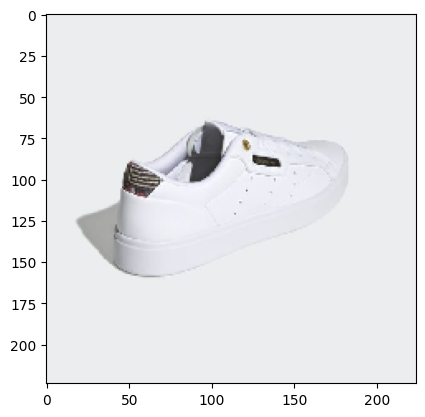

name:  datathon/adidas_sleek_shoes


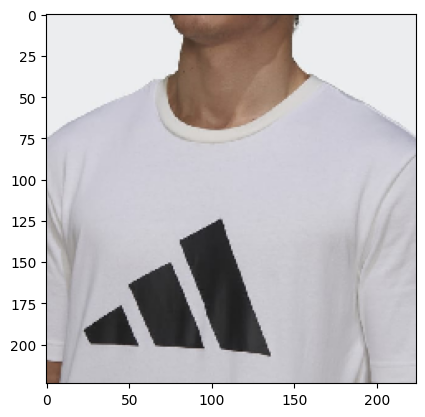

name:  datathon/adidas_sportswear_future_icons_logo_graphic_tee


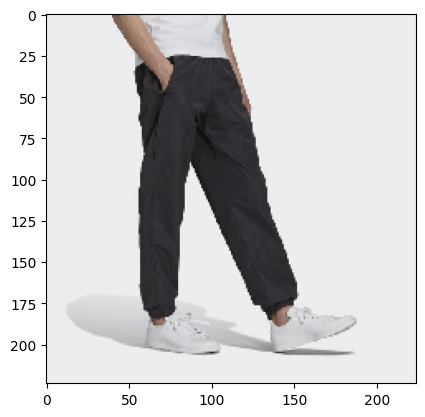

name:  datathon/adicolor_track_pants


In [10]:
item1 = 'datathon/adidas_sleek_shoes_image_5.jpg'
item2 = 'datathon/adidas_sportswear_future_icons_logo_graphic_tee_image_7.jpg'
item3 = 'datathon/adicolor_track_pants_image_3.jpg'
items = [item1, item2, item3]
for item in items:
    name = getID(item)
    original = load_img(item, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
n_recommendations = 50

## BRIDGE REGRESSION 

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:237: LinAlgWarning: Ill-conditioned matrix (rcond=2.35161e-09): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


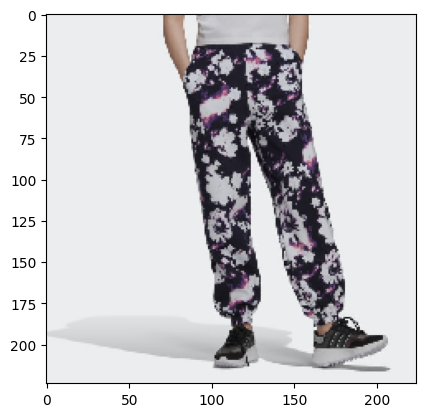

name:  datathon/track_pants
rating:  9.477255e-06


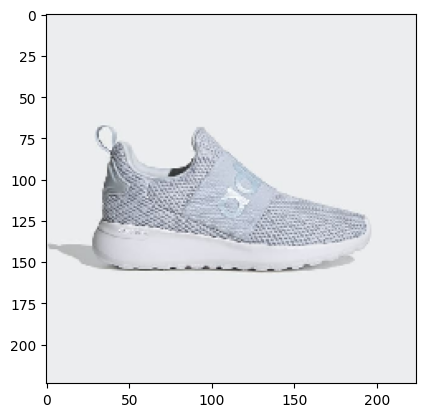

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  7.94325e-06


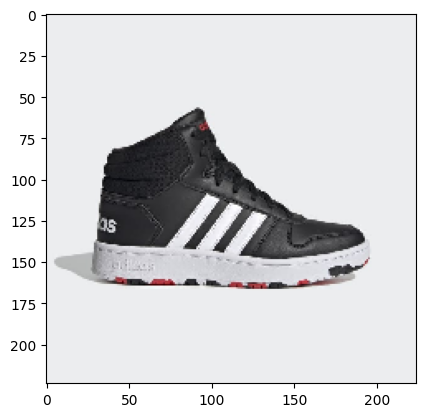

name:  datathon/hoops_2.0_mid_shoes
rating:  7.860945e-06


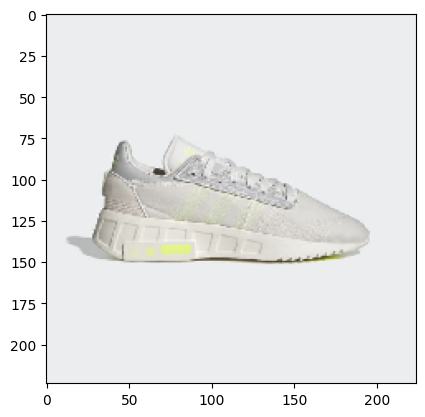

name:  datathon/geodiver_primeblue_shoes
rating:  7.0186798e-06


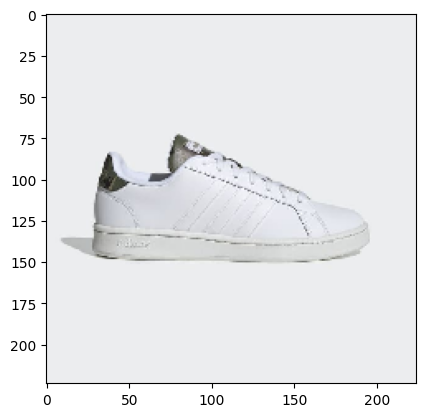

name:  datathon/grand_court_shoes
rating:  6.9577945e-06


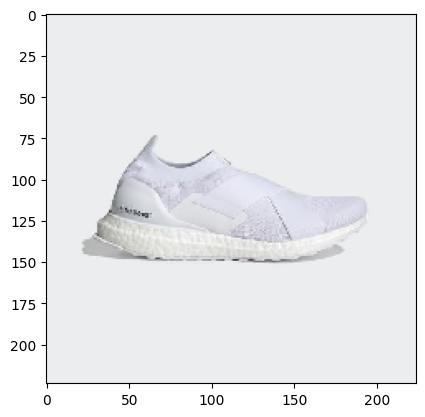

name:  datathon/ultraboost_slip-on_dna_shoes
rating:  6.7977235e-06


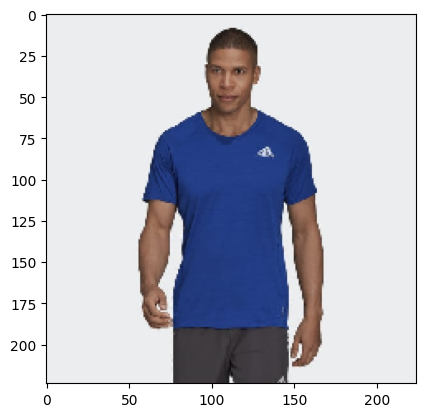

name:  datathon/runner_tee
rating:  6.5285712e-06


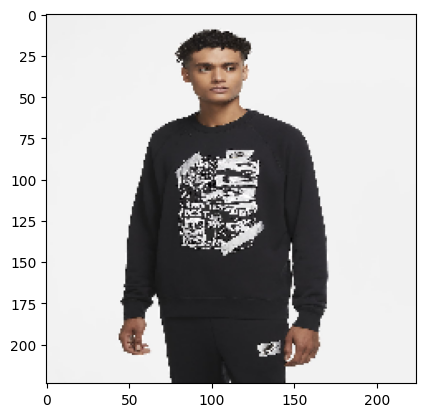

name:  datathon/nike_sportswear
rating:  6.4818887e-06


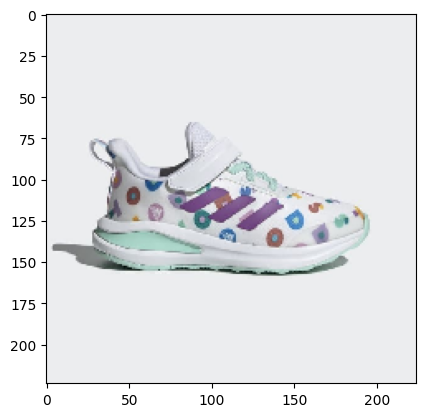

name:  datathon/adidas_fortarun_x_lego¨_dotsª_shoes
rating:  6.324728e-06


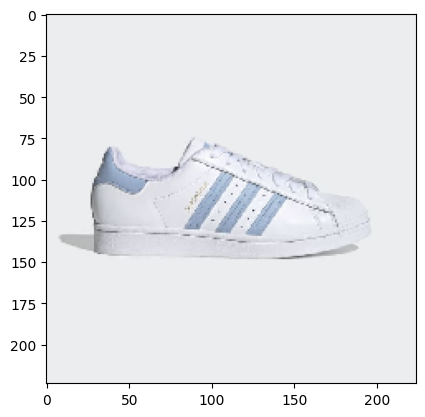

name:  datathon/superstar_shoes
rating:  6.28375e-06


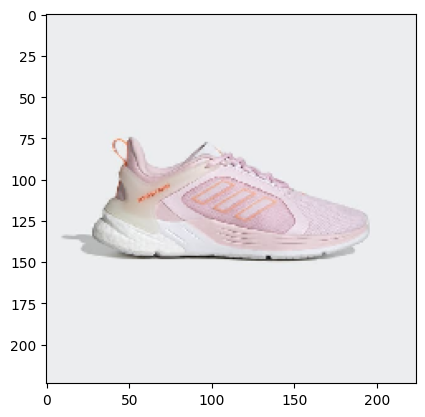

name:  datathon/response_super_2.0_shoes
rating:  6.190501e-06


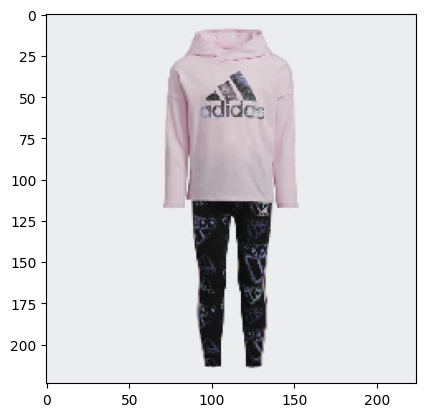

name:  datathon/long_sleeve_tee_and_printed_tights_set
rating:  6.0757156e-06


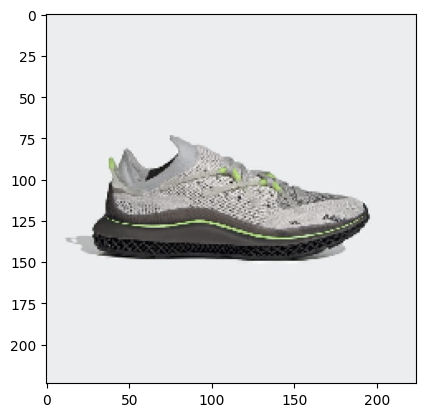

name:  datathon/4d_fusio_shoes
rating:  5.495618e-06


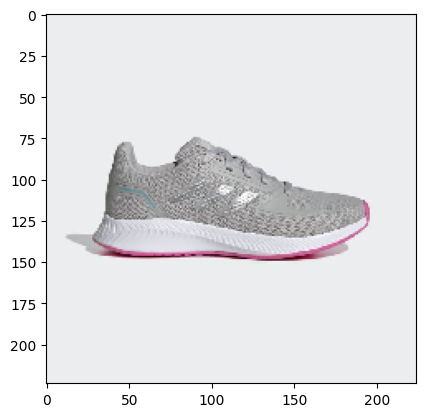

name:  datathon/runfalcon_2.0_shoes
rating:  5.443697e-06


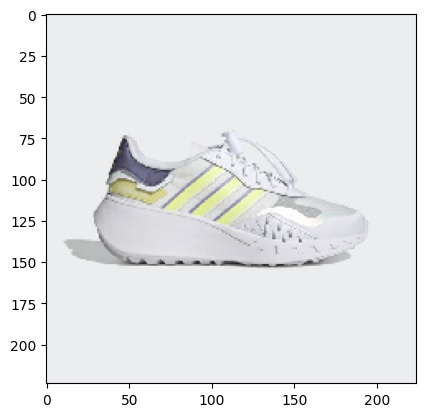

name:  datathon/choigo_shoes
rating:  5.4419506e-06


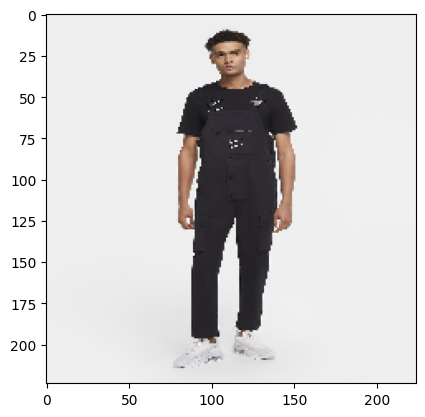

name:  datathon/nike_sportswear_swoosh
rating:  5.3242547e-06


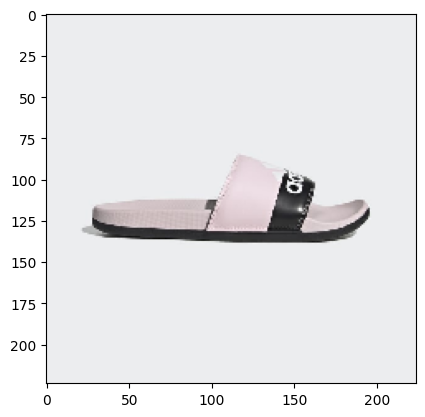

name:  datathon/adilette_comfort_sandals
rating:  5.2170362e-06


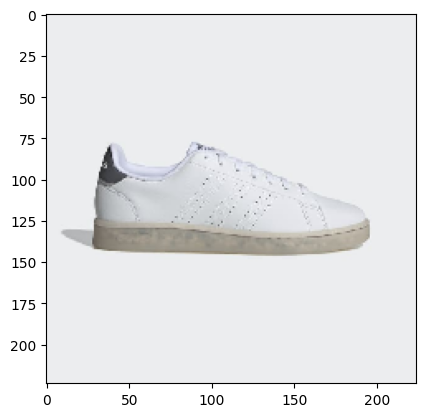

name:  datathon/advantage_eco_shoes
rating:  5.123322e-06


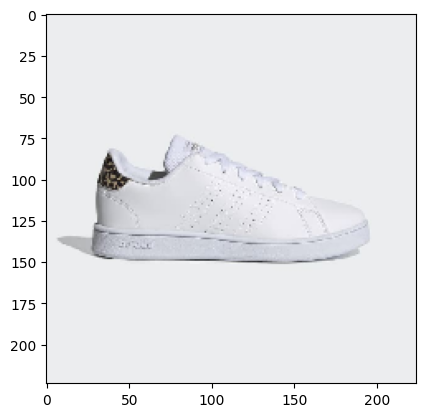

name:  datathon/advantage_shoes
rating:  5.0637173e-06


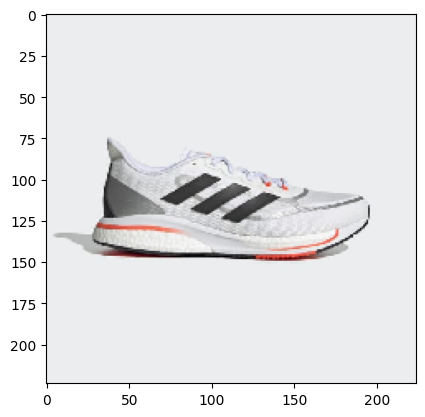

name:  datathon/supernova+_shoes
rating:  4.8973598e-06


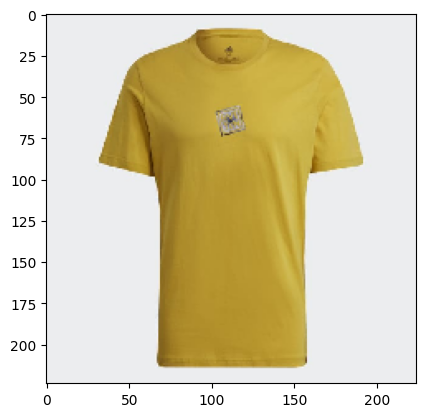

name:  datathon/five_ten_heritage_logo_tee
rating:  4.7757057e-06


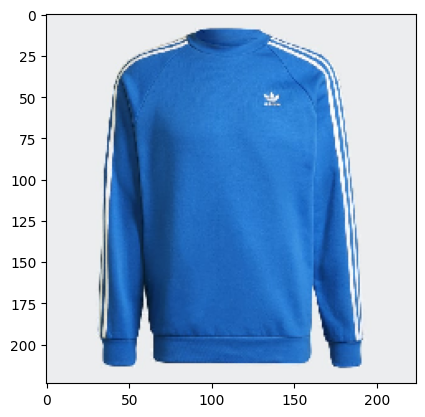

name:  datathon/adicolor_classics_3-stripes_crew_sweatshirt
rating:  4.7297217e-06


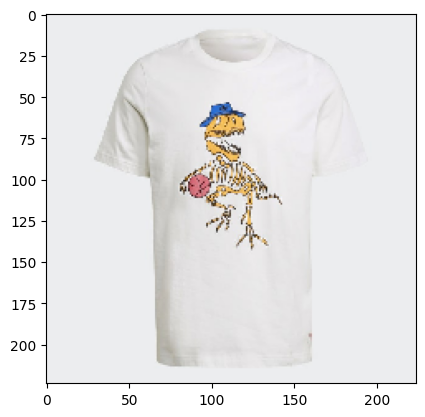

name:  datathon/funny_dino_tee_(gender_neutral)
rating:  4.546484e-06


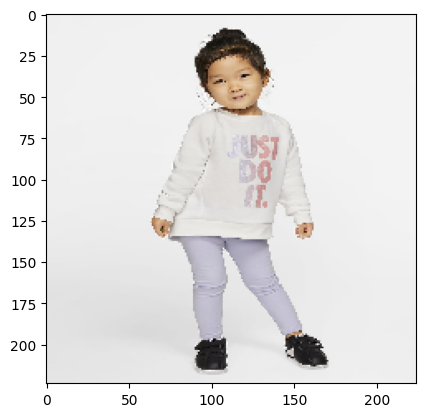

name:  datathon/nike
rating:  4.4931658e-06


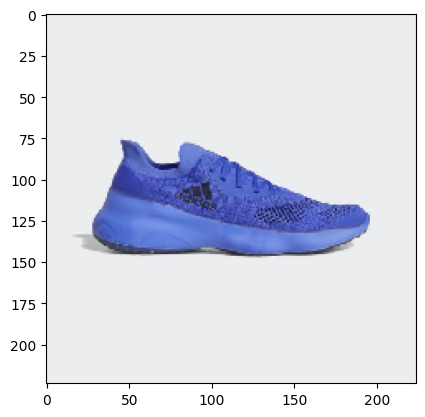

name:  datathon/futurenatural_shoes
rating:  4.451489e-06


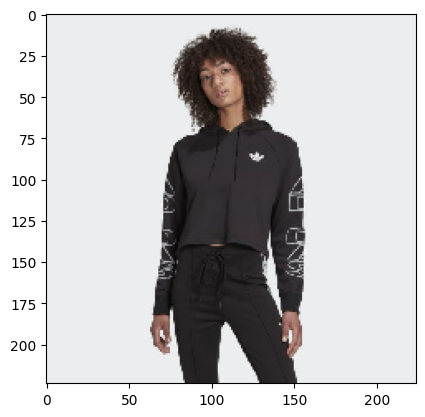

name:  datathon/cropped_letter_hoodie
rating:  4.3512555e-06


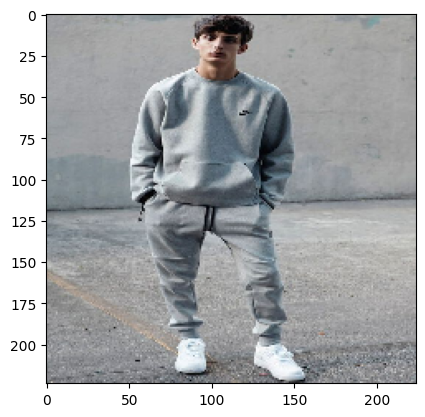

name:  datathon/test
rating:  3.8834987e-06


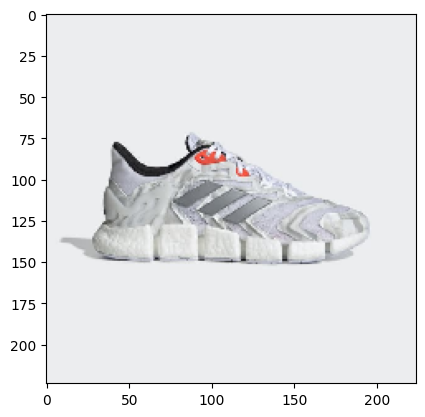

name:  datathon/climacool_vento_shoes
rating:  3.7889695e-06


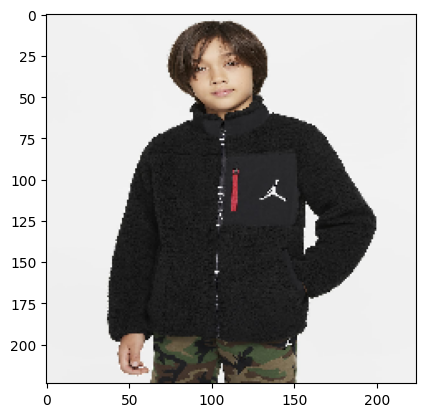

name:  datathon/jordan
rating:  3.7085265e-06


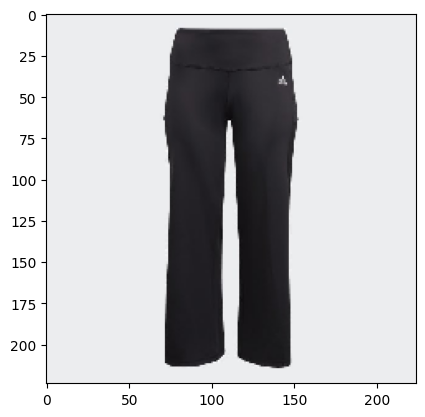

name:  datathon/designed_2_move_bootcut_pants_(plus_size)
rating:  3.6022393e-06


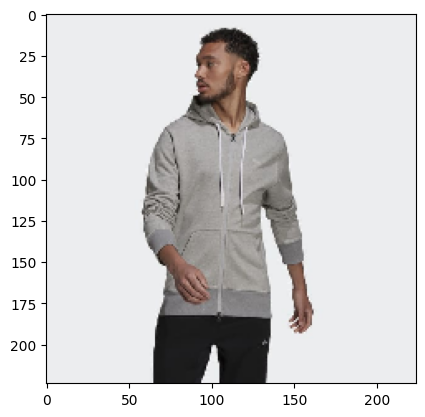

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
rating:  3.6022393e-06


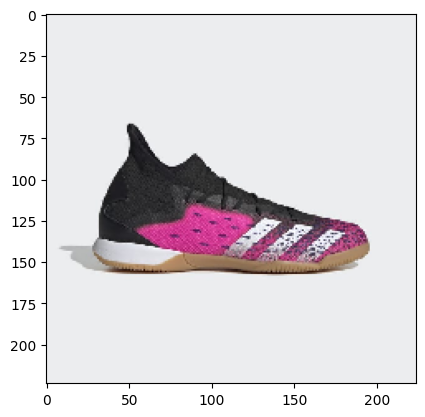

name:  datathon/predator_freak.3_indoor_shoes
rating:  3.4840778e-06


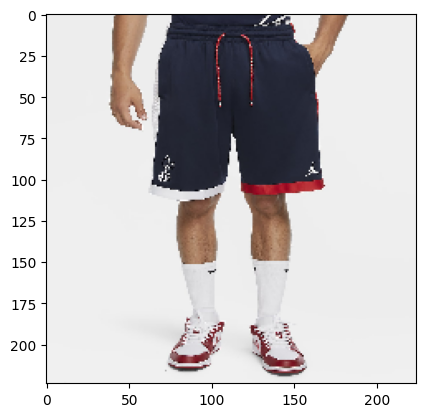

name:  datathon/jordan_france
rating:  3.4807017e-06


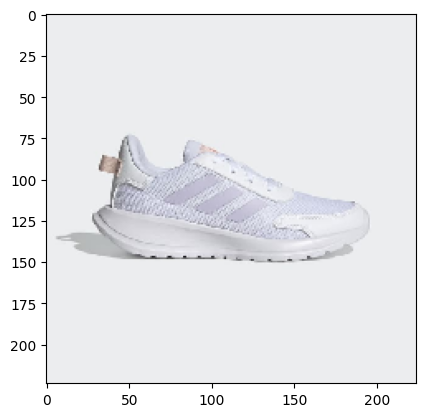

name:  datathon/tensor_run_shoes
rating:  3.3321558e-06


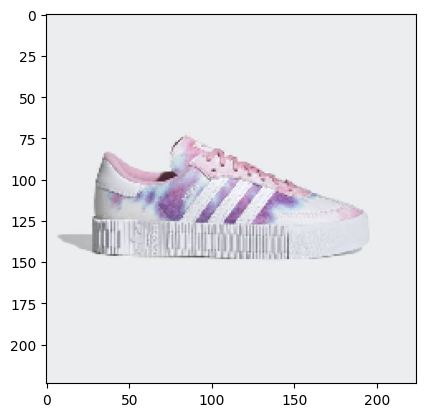

name:  datathon/sambarose_shoes
rating:  3.2995595e-06


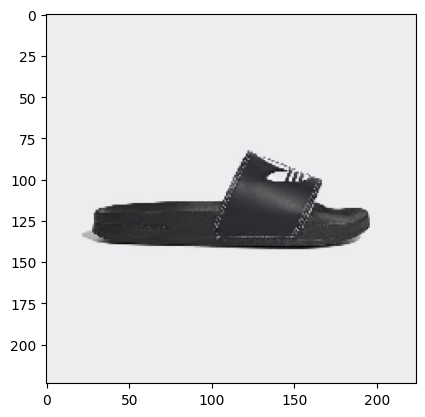

name:  datathon/adilette_lite_slides
rating:  3.2252865e-06


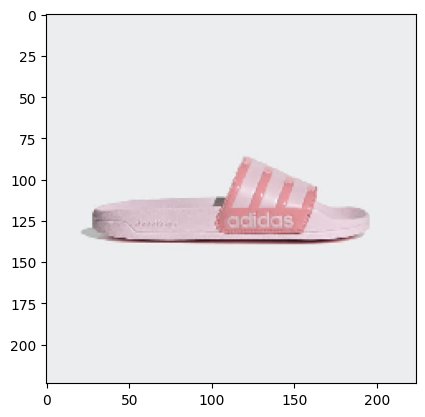

name:  datathon/adilette_shower_slides
rating:  3.1822128e-06


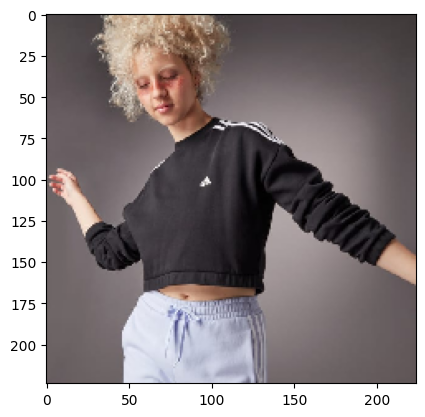

name:  datathon/hyperglam_crop_crew_sweatshirt
rating:  3.1499658e-06


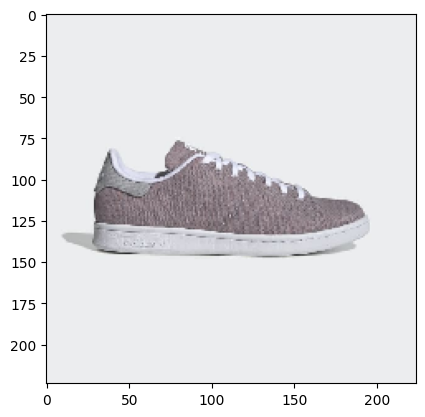

name:  datathon/stan_smith_shoes
rating:  3.1274976e-06


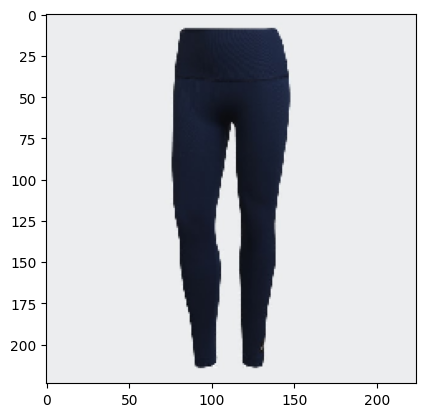

name:  datathon/formotion_sculpt_tights
rating:  3.1178351e-06


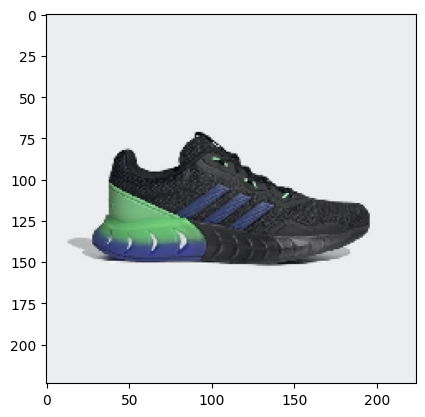

name:  datathon/kaptir_super_shoes
rating:  3.1006057e-06


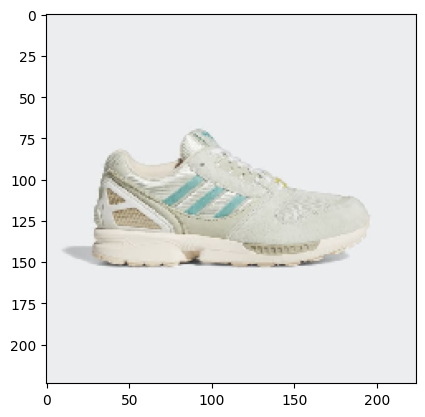

name:  datathon/zx_8000_shoes
rating:  3.1000236e-06


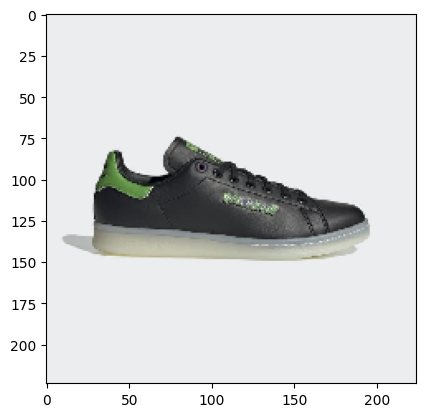

name:  datathon/hulk_stan_smith_shoes
rating:  3.0873343e-06


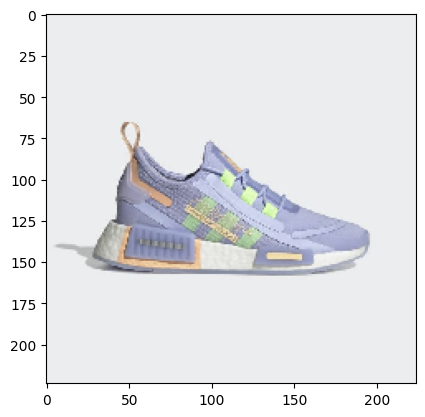

name:  datathon/nmd_r1_spectoo_shoes
rating:  3.0180672e-06


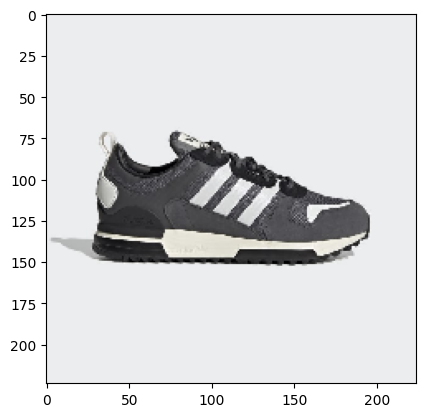

name:  datathon/zx_700_hd_shoes
rating:  2.9961811e-06


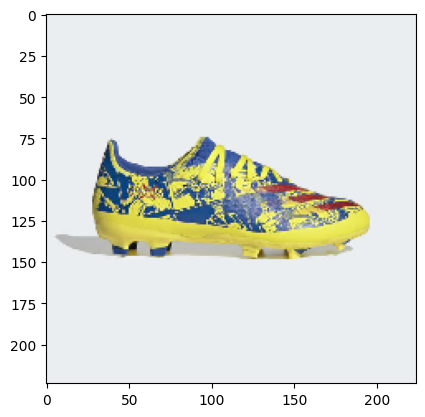

name:  datathon/marvel_x_ghosted.3_firm_ground_cleats
rating:  2.9682415e-06


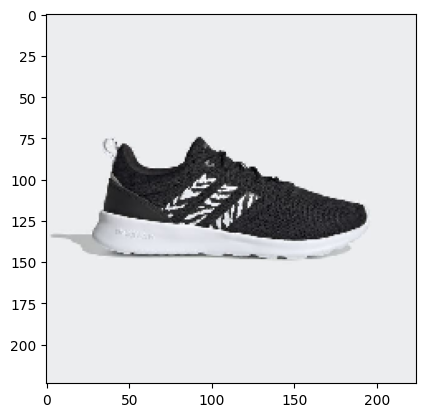

name:  datathon/qt_racer_2.0_shoes
rating:  2.9541552e-06


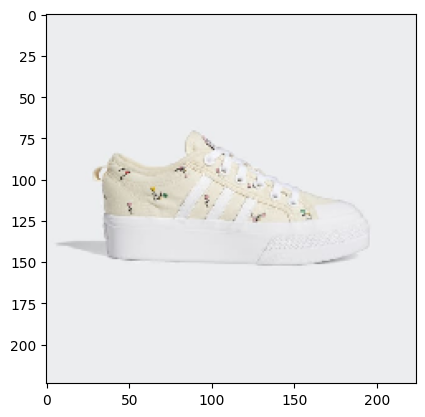

name:  datathon/nizza_platform_shoes
rating:  2.8683571e-06


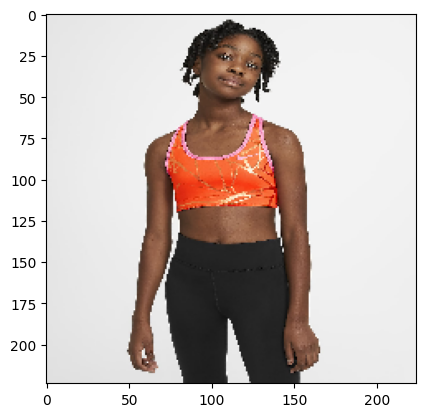

name:  datathon/nike_dri-fit_swoosh
rating:  2.757064e-06


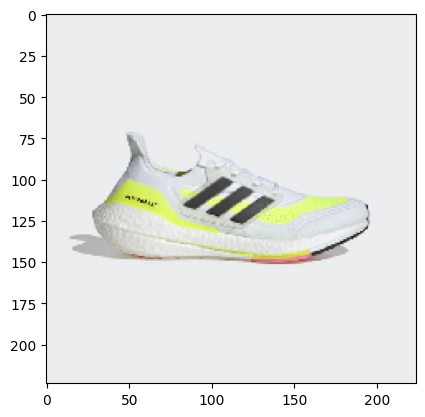

name:  datathon/ultraboost_21_shoes
rating:  2.7327333e-06


In [11]:
from sklearn import linear_model

scores = np.zeros(products_features.shape[0])
indices = [products.index.get_loc(idx) for idx in items]
scores[indices] = 1
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, scores)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)

## AVERAGE FEATURES

In [12]:
indices = [products.index.get_loc(idx) for idx in items]
X = np.zeros(products_features.shape[1])
for index in indices:
    X = products_features[index] + X
X = X/len(indices)
vector_cosine = cosine_similarity(X.reshape(1, -1), products_features)
vector_cosine = vector_cosine.reshape(-1)
top_indices = np.argsort(vector_cosine)[::-1]

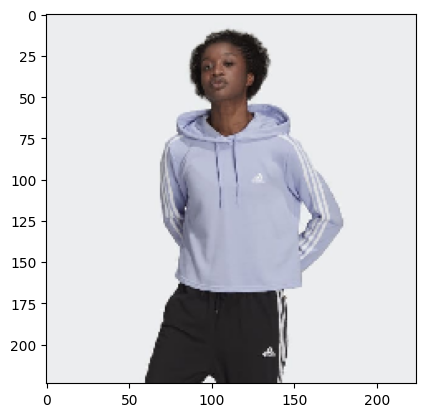

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.773650742096241


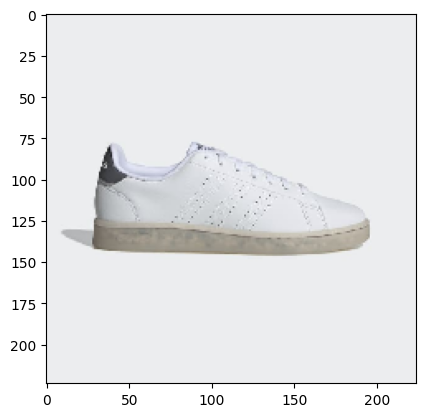

name:  datathon/advantage_eco_shoes
rating:  0.7724106236276164


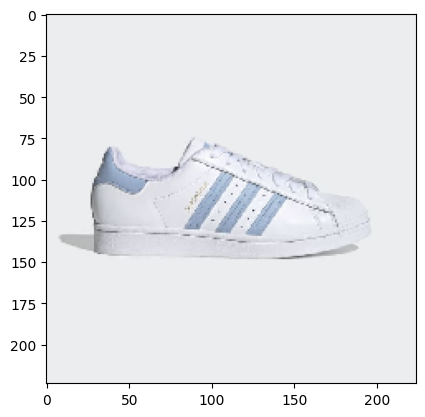

name:  datathon/superstar_shoes
rating:  0.7713946589534239


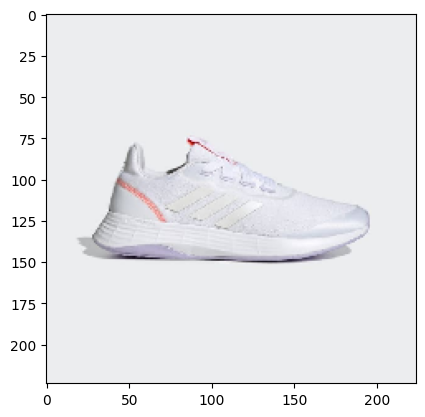

name:  datathon/qt_racer_sport_shoes
rating:  0.763727237757792


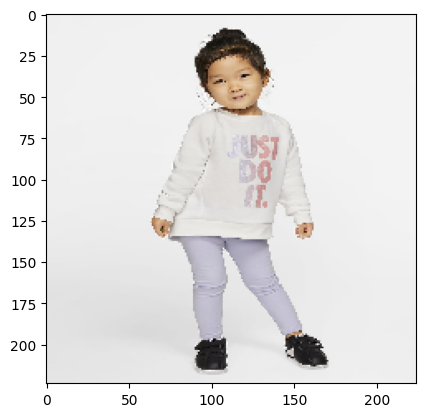

name:  datathon/nike
rating:  0.7619019359794729


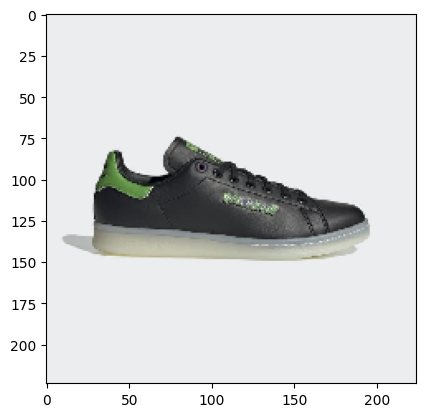

name:  datathon/hulk_stan_smith_shoes
rating:  0.7607067559083223


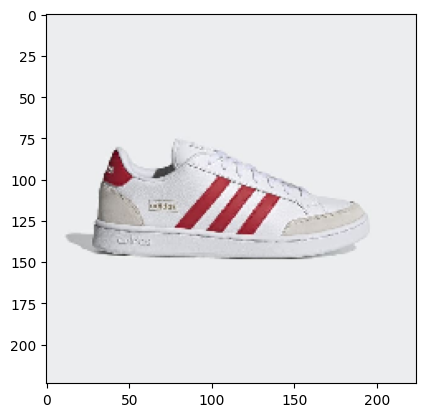

name:  datathon/grand_court_se_shoes
rating:  0.7592784249798314


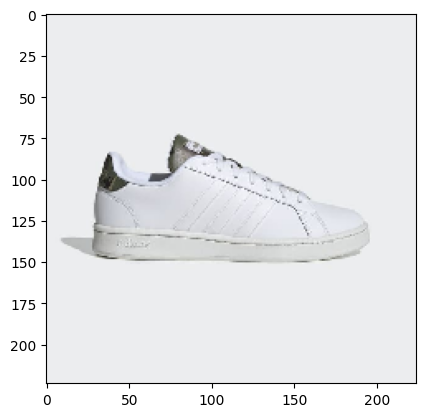

name:  datathon/grand_court_shoes
rating:  0.757831564881775


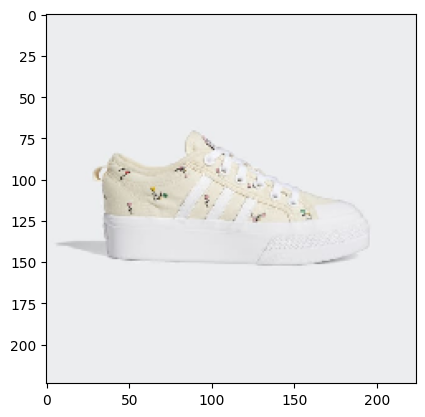

name:  datathon/nizza_platform_shoes
rating:  0.7556131021343746


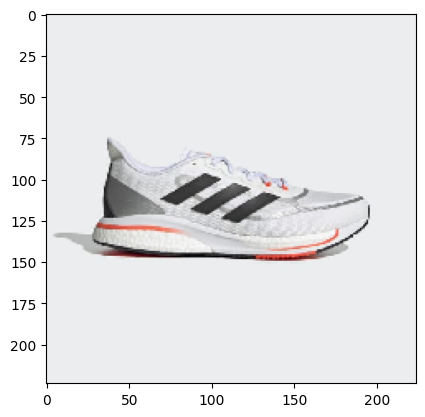

name:  datathon/supernova+_shoes
rating:  0.7549919354613752


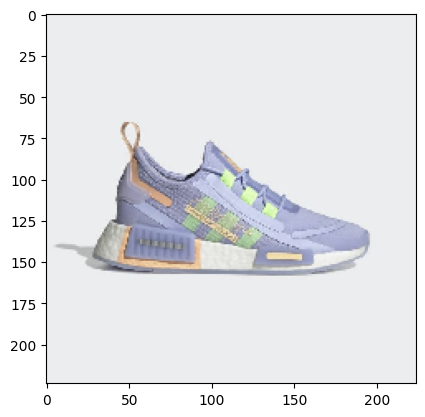

name:  datathon/nmd_r1_spectoo_shoes
rating:  0.7539688576000635


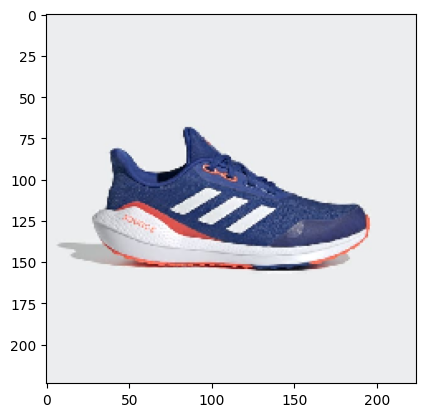

name:  datathon/eq21_run_shoes
rating:  0.7531340959067901


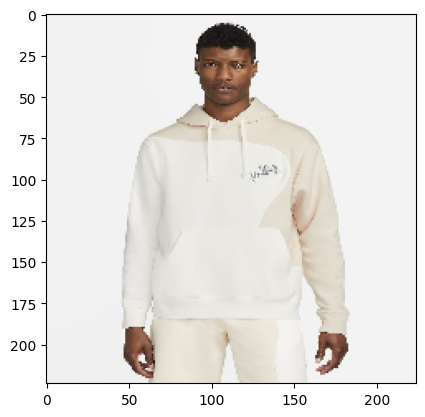

name:  datathon/nike_sportswear_club
rating:  0.7529883710906756


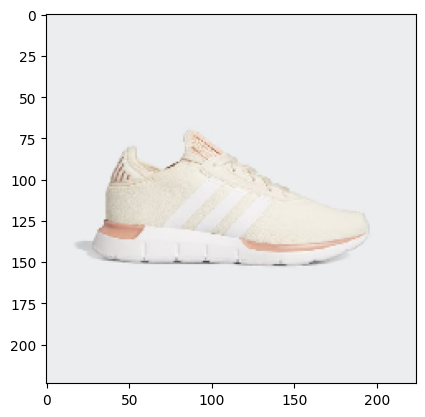

name:  datathon/swift_x_shoes
rating:  0.7513687491523839


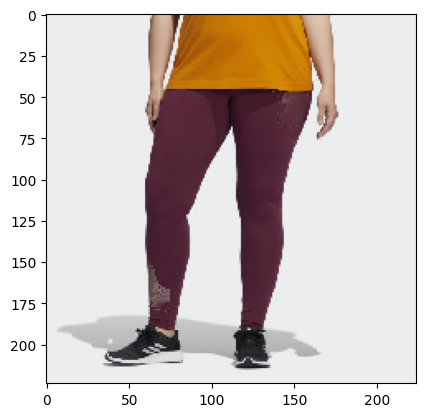

name:  datathon/holiday_graphic_tights_(plus_size)
rating:  0.7497100720313795


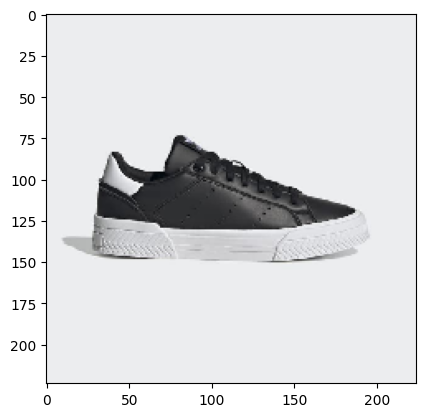

name:  datathon/court_tourino_shoes
rating:  0.7473667730129137


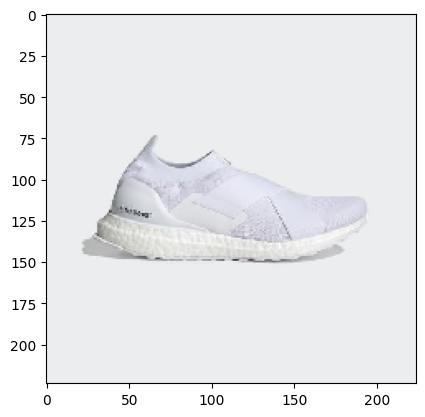

name:  datathon/ultraboost_slip-on_dna_shoes
rating:  0.7459962710342203


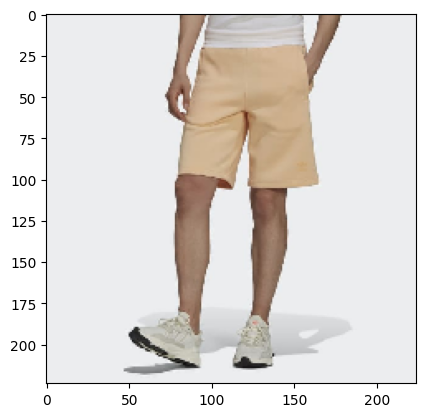

name:  datathon/adicolor_classics_mm_trefoil_shorts
rating:  0.7447624157551025


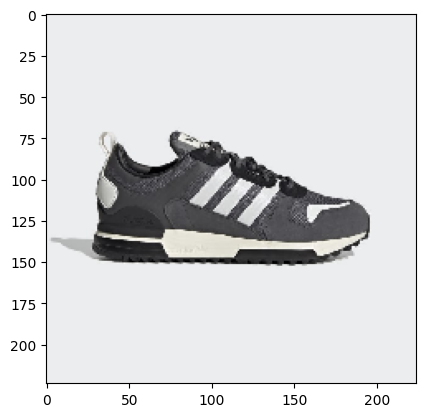

name:  datathon/zx_700_hd_shoes
rating:  0.7443031991152047


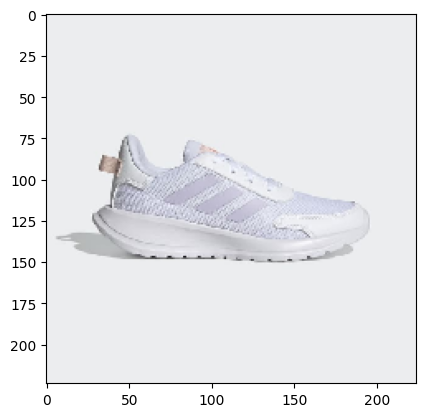

name:  datathon/tensor_run_shoes
rating:  0.7434942623562297


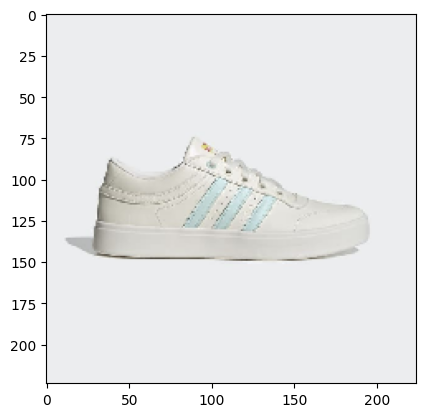

name:  datathon/bryony_shoes
rating:  0.7415265016326015


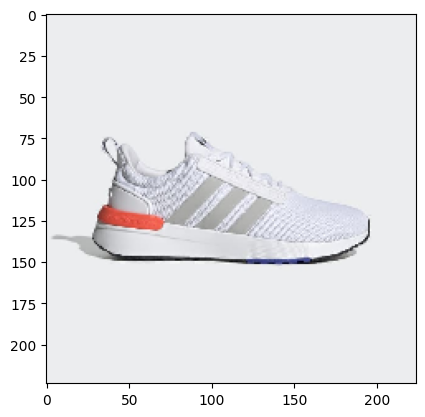

name:  datathon/racer_tr21_wide_shoes
rating:  0.7407014693041937


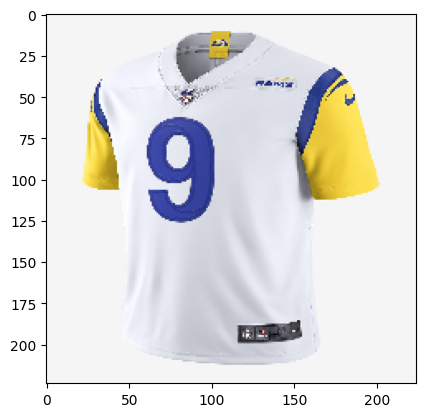

name:  datathon/nfl_los_angeles_rams_nike_vapor_untouchable_(matthew_stafford)
rating:  0.7403928081610773


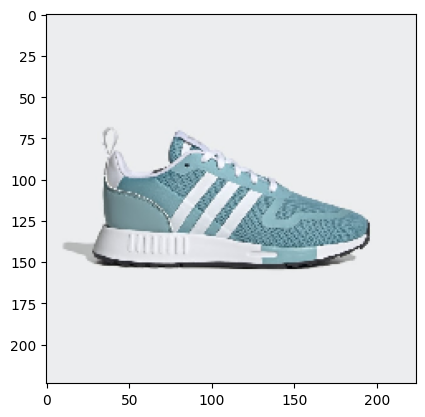

name:  datathon/multix_shoes
rating:  0.7402905436835094


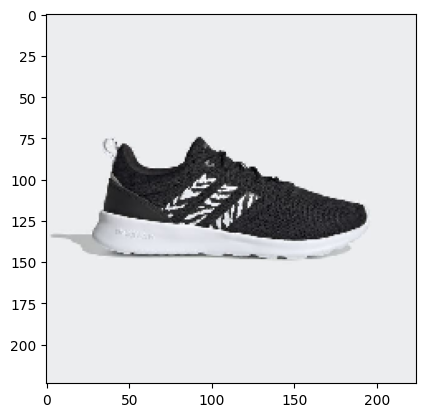

name:  datathon/qt_racer_2.0_shoes
rating:  0.7399297315758516


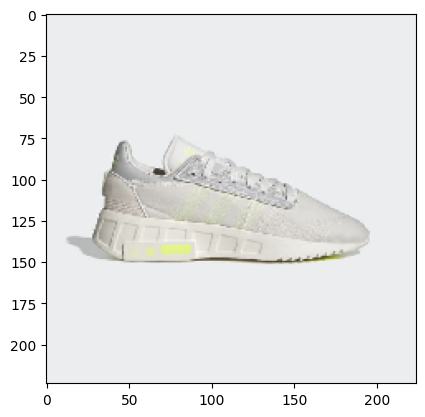

name:  datathon/geodiver_primeblue_shoes
rating:  0.7386761520215334


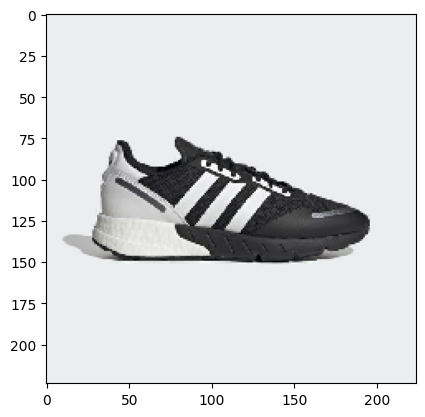

name:  datathon/zx_1k_boost_shoes
rating:  0.7378743095211653


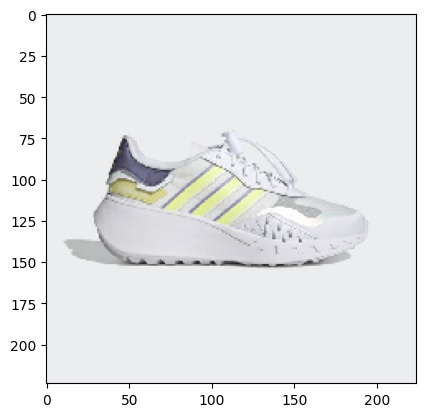

name:  datathon/choigo_shoes
rating:  0.7373167266546423


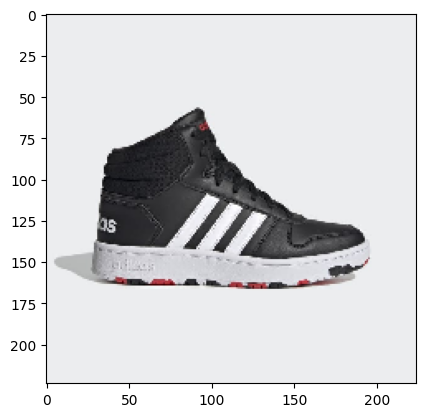

name:  datathon/hoops_2.0_mid_shoes
rating:  0.7369622929519682


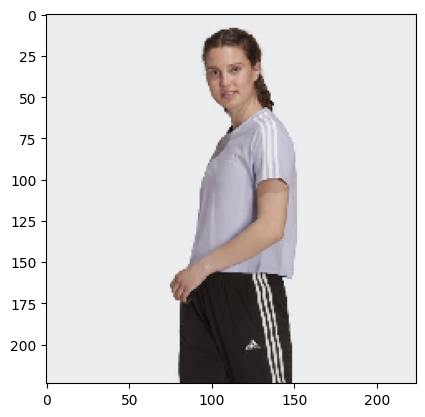

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.7368150828687484


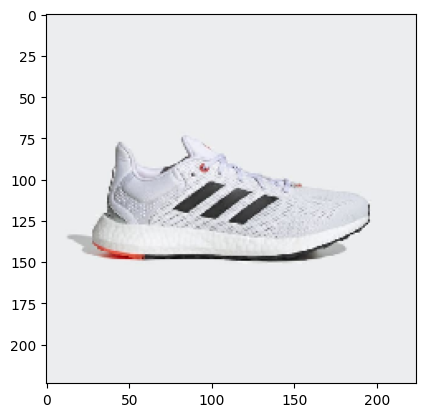

name:  datathon/pureboost_21_shoes
rating:  0.7355612014783908


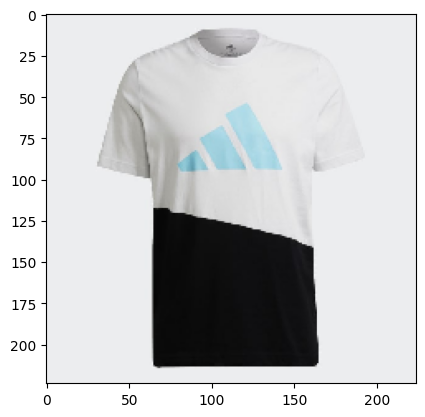

name:  datathon/graphic_tee
rating:  0.7354640051545769


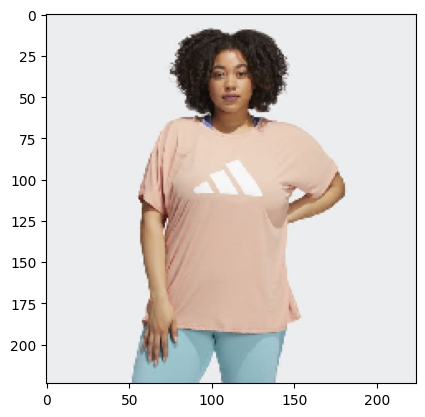

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.7353428215475942


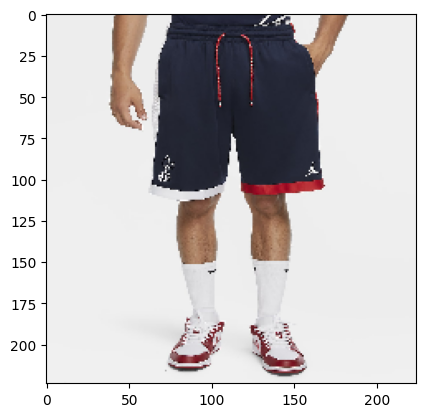

name:  datathon/jordan_france
rating:  0.7350664164402849


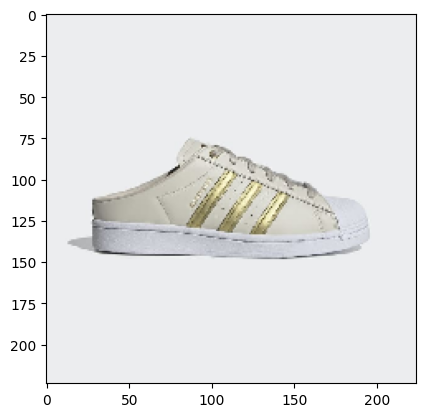

name:  datathon/superstar_mules
rating:  0.7346241565875833


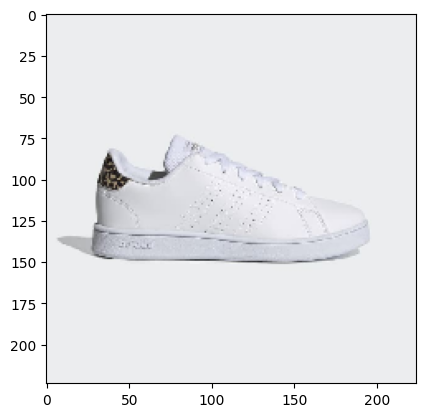

name:  datathon/advantage_shoes
rating:  0.734562608831328


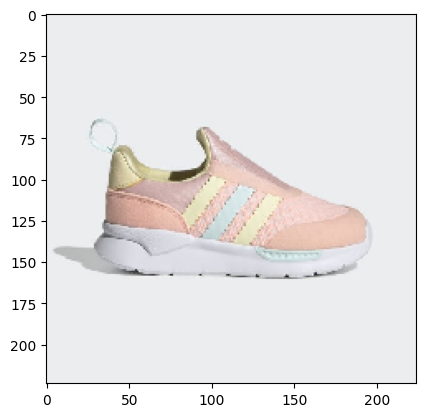

name:  datathon/zx_360_shoes
rating:  0.7341617516567827


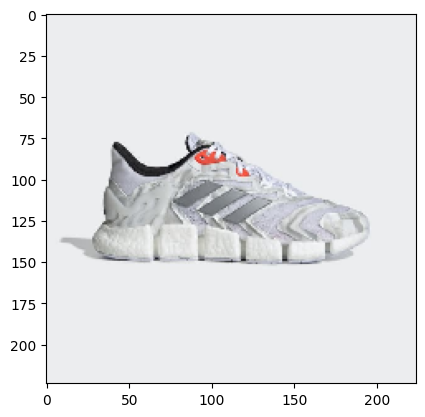

name:  datathon/climacool_vento_shoes
rating:  0.7333153581311689


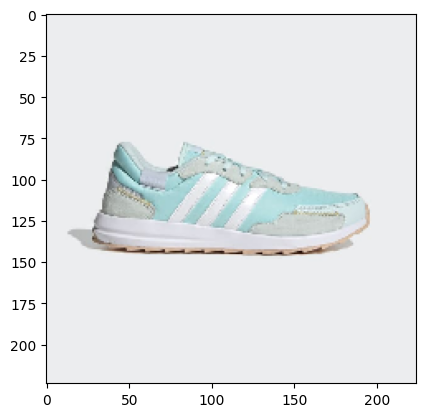

name:  datathon/retrorun_shoes
rating:  0.733229696273415


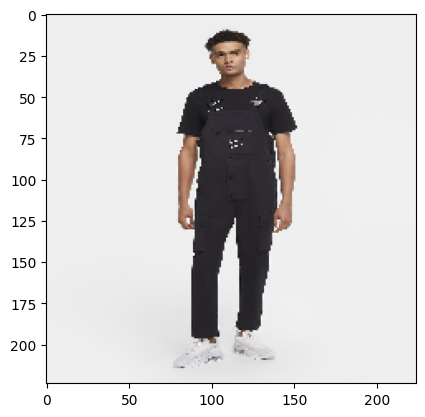

name:  datathon/nike_sportswear_swoosh
rating:  0.731779501179393


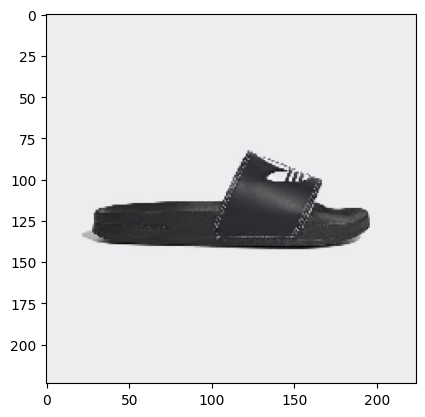

name:  datathon/adilette_lite_slides
rating:  0.7308235265414057


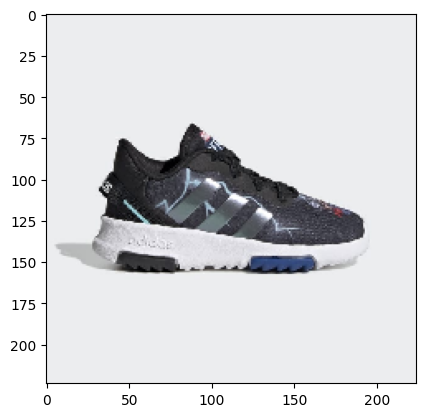

name:  datathon/marvel_superhero_racer_tr_2.0_shoes
rating:  0.7304372538765684


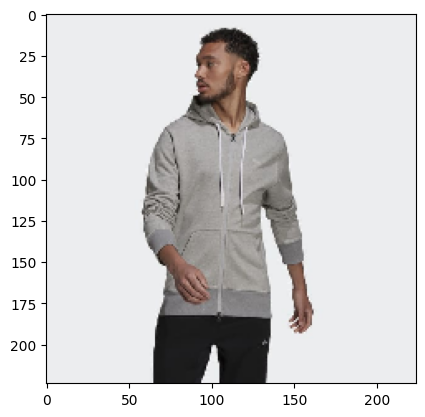

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
rating:  0.7287022631731412


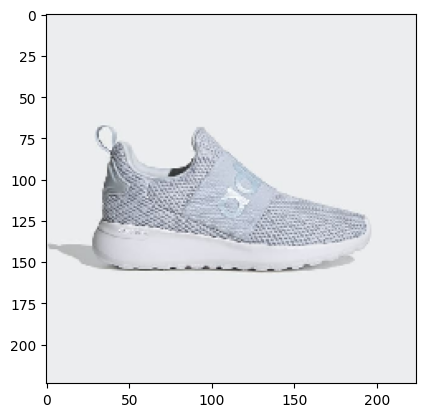

name:  datathon/lite_racer_adapt_4.0_shoes
rating:  0.7281043975851297


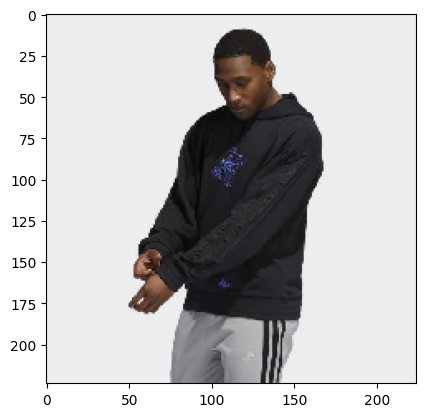

name:  datathon/lil_stripe_ignite_szn_hoodie
rating:  0.727788835388982


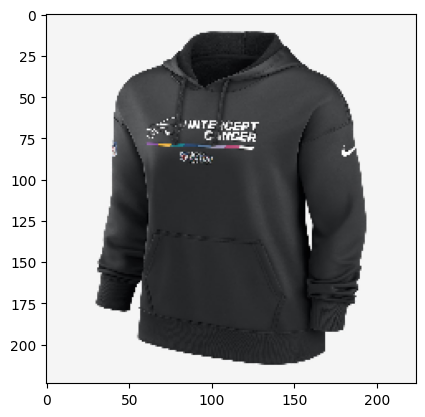

name:  datathon/nike_dri-fit_crucial_catch_(nfl_buffalo_bills)
rating:  0.7277834930137617


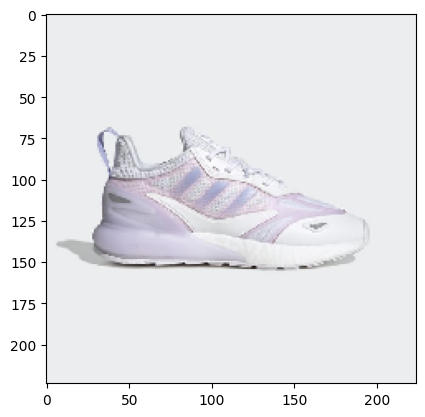

name:  datathon/zx_2k_boost_2.0_shoes
rating:  0.7275245913829596


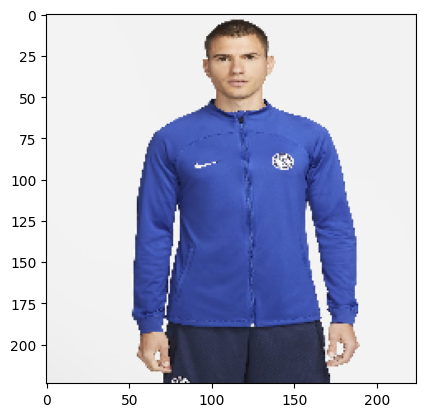

name:  datathon/chelsea_fc_strike
rating:  0.7268246360448827


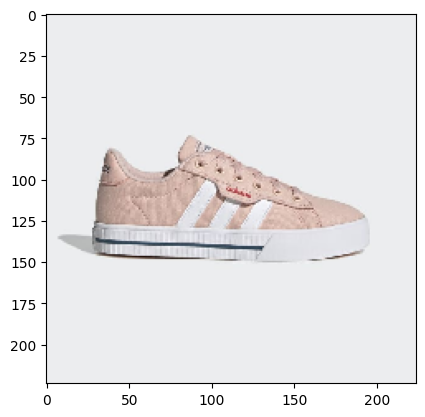

name:  datathon/daily_3.0_shoes
rating:  0.726751616744193


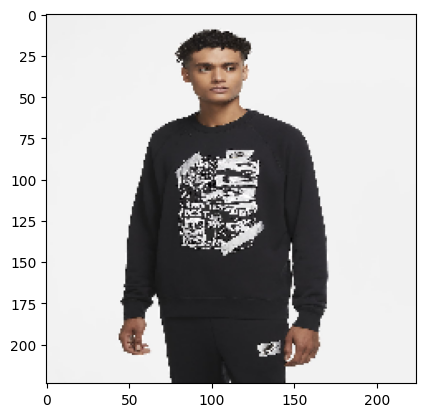

name:  datathon/nike_sportswear
rating:  0.7262701260349056


In [13]:
i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", vector_cosine[top_indices[i]])
    i+=1
    showed_items.append(name)

## COSINE SIMILARITY + RIDGE REGRESSION

In [14]:
def calculate_cosine(vector1, vector2):
    dot_product = np.dot(vector1, vector2)
    norm_vector1 = np.linalg.norm(vector1)
    norm_vector2 = np.linalg.norm(vector2)

    similarity = dot_product / (norm_vector1 * norm_vector2)

    return similarity

In [15]:
vector_cosine = np.zeros(products.shape[0])
for item in items:
    item_features = np.array(products.loc[item])
    cosine_similarity = []
    for i in range(0, products.shape[0]):
        item_i = np.array(products_features[i,:])
        cosine_similarity.append(calculate_cosine(item_features, item_i))
    cosine_similarity = np.array(cosine_similarity)
    vector_cosine = vector_cosine + cosine_similarity
vector_cosine = vector_cosine/len(items)

/Users/pianokill/miniconda3/envs/datathon/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:237: LinAlgWarning: Ill-conditioned matrix (rcond=2.35161e-09): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


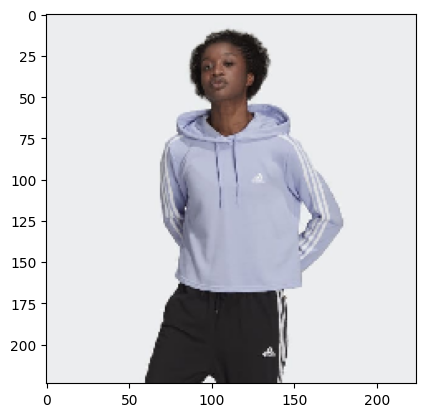

name:  datathon/essentials_3-stripes_cropped_hoodie
rating:  0.6453401


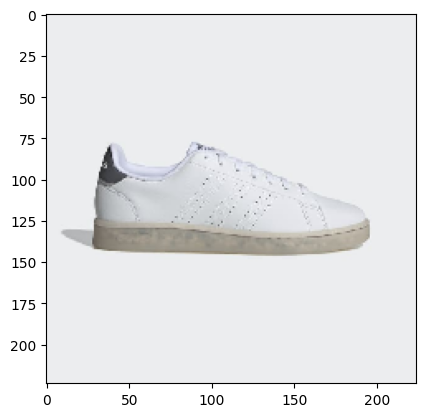

name:  datathon/advantage_eco_shoes
rating:  0.6322347


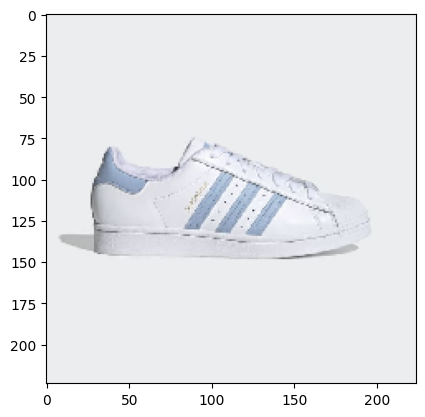

name:  datathon/superstar_shoes
rating:  0.63162386


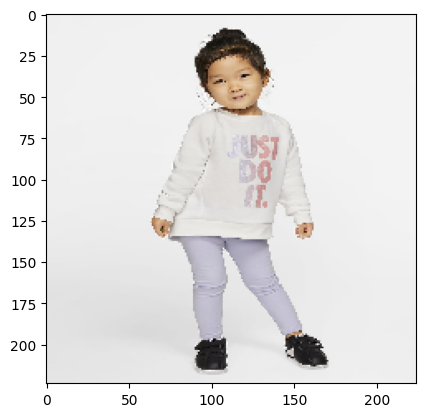

name:  datathon/nike
rating:  0.6314495


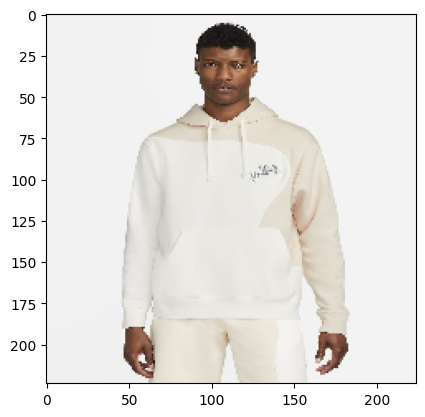

name:  datathon/nike_sportswear_club
rating:  0.6301512


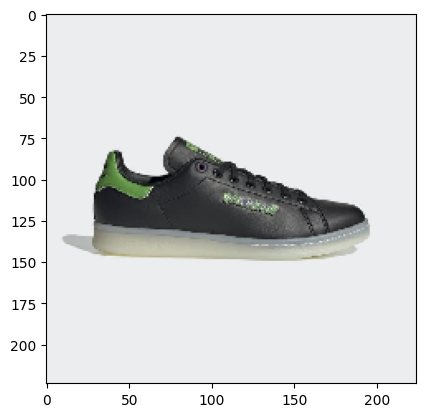

name:  datathon/hulk_stan_smith_shoes
rating:  0.62806237


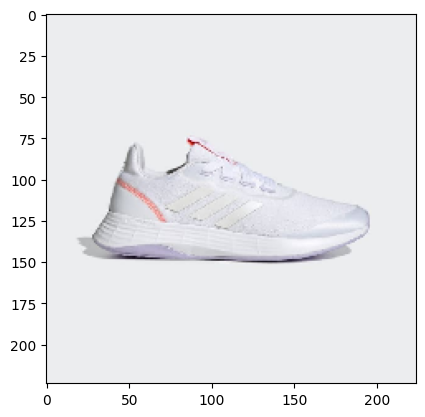

name:  datathon/qt_racer_sport_shoes
rating:  0.6262278


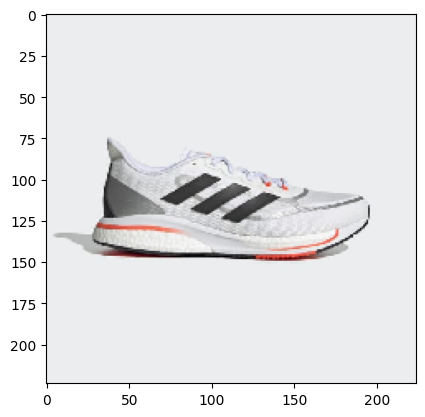

name:  datathon/supernova+_shoes
rating:  0.6252339


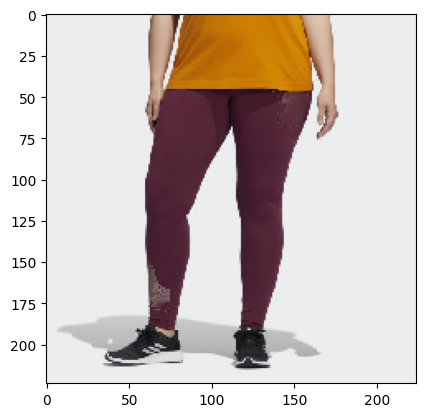

name:  datathon/holiday_graphic_tights_(plus_size)
rating:  0.62391526


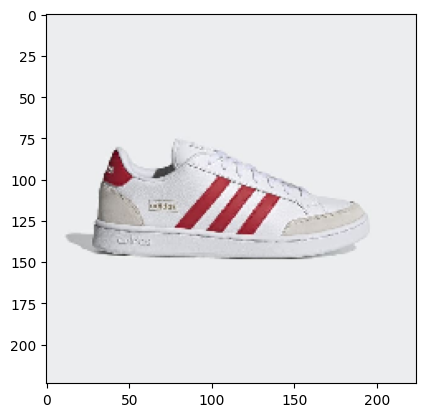

name:  datathon/grand_court_se_shoes
rating:  0.62326765


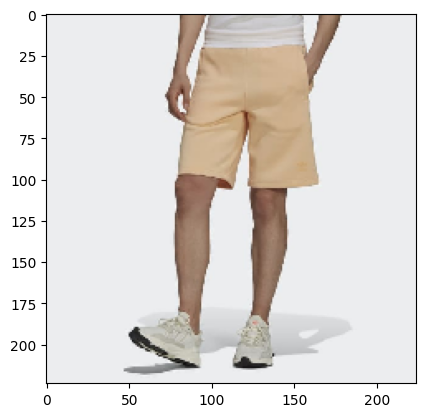

name:  datathon/adicolor_classics_mm_trefoil_shorts
rating:  0.6196242


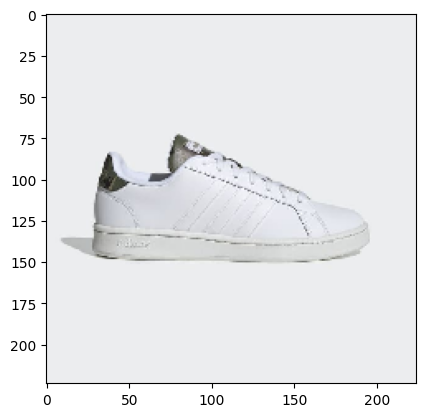

name:  datathon/grand_court_shoes
rating:  0.61956906


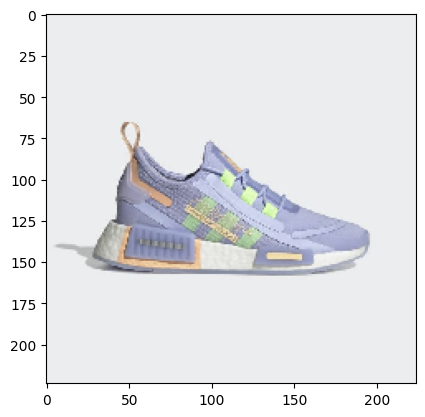

name:  datathon/nmd_r1_spectoo_shoes
rating:  0.619524


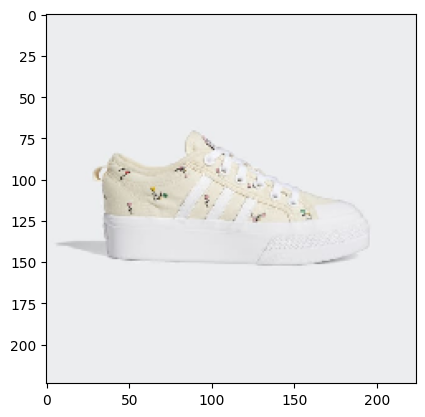

name:  datathon/nizza_platform_shoes
rating:  0.6190944


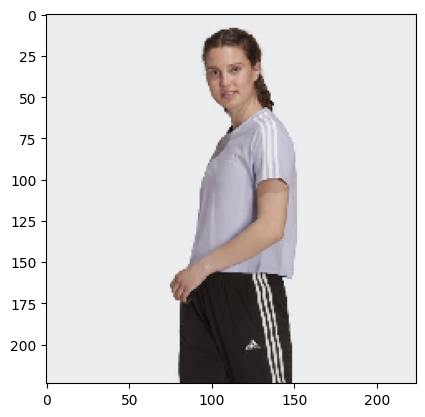

name:  datathon/essentials_loose_3-stripes_cropped_tee
rating:  0.61885816


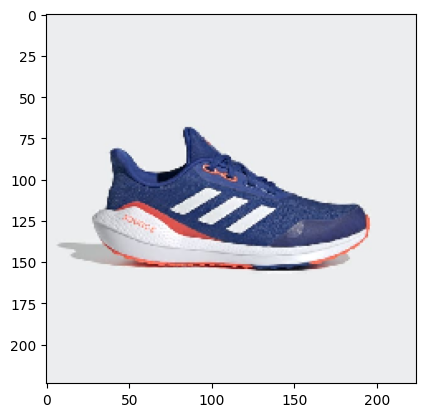

name:  datathon/eq21_run_shoes
rating:  0.6187651


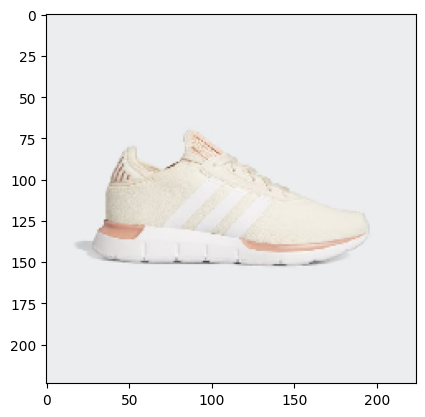

name:  datathon/swift_x_shoes
rating:  0.61853117


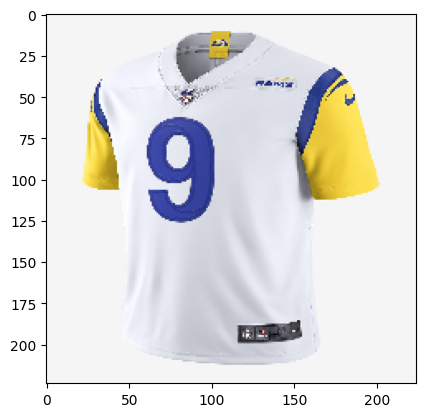

name:  datathon/nfl_los_angeles_rams_nike_vapor_untouchable_(matthew_stafford)
rating:  0.61602813


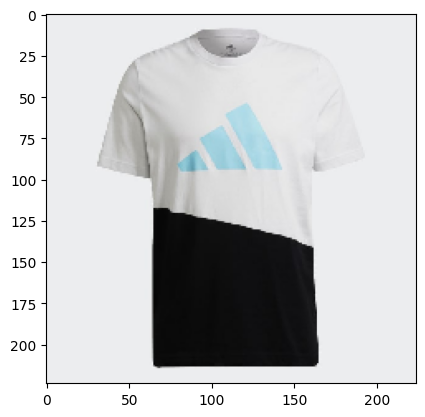

name:  datathon/graphic_tee
rating:  0.61521995


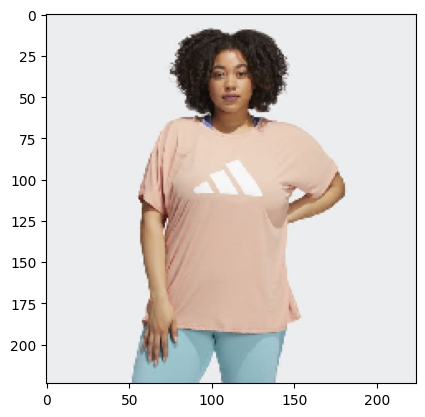

name:  datathon/3-stripes_training_tee_(plus_size)
rating:  0.6152161


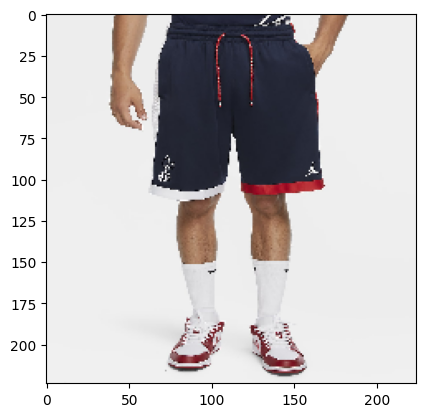

name:  datathon/jordan_france
rating:  0.61302257


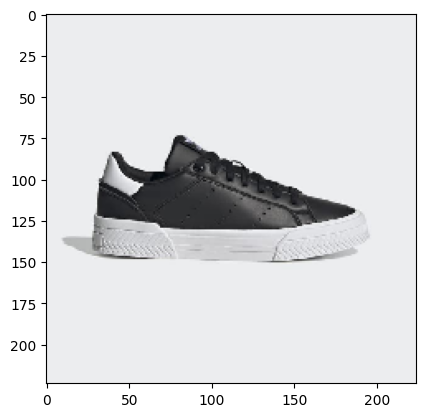

name:  datathon/court_tourino_shoes
rating:  0.612662


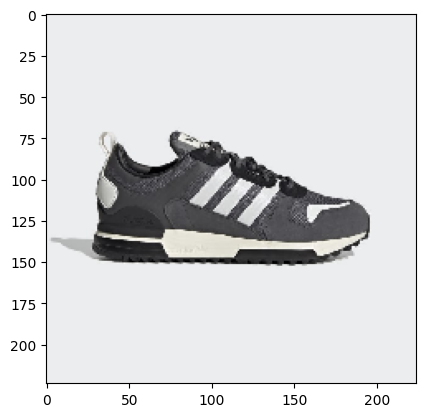

name:  datathon/zx_700_hd_shoes
rating:  0.61207205


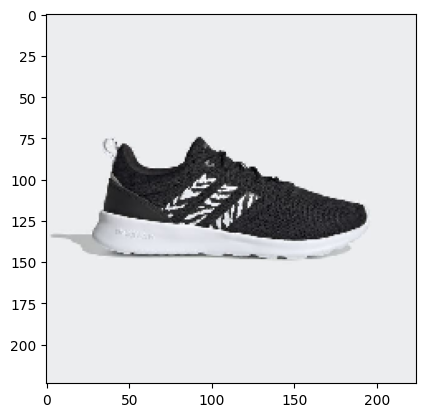

name:  datathon/qt_racer_2.0_shoes
rating:  0.6113467


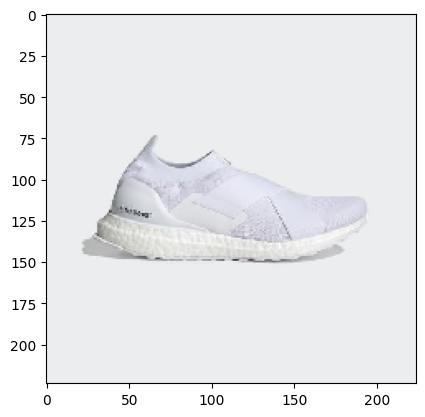

name:  datathon/ultraboost_slip-on_dna_shoes
rating:  0.610851


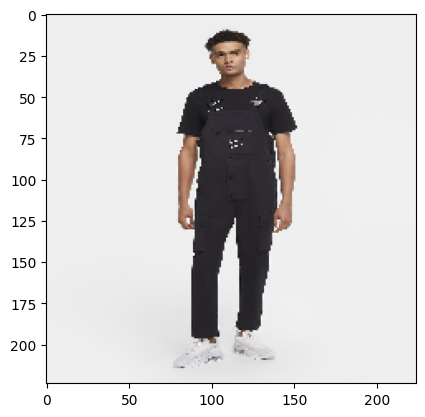

name:  datathon/nike_sportswear_swoosh
rating:  0.61057675


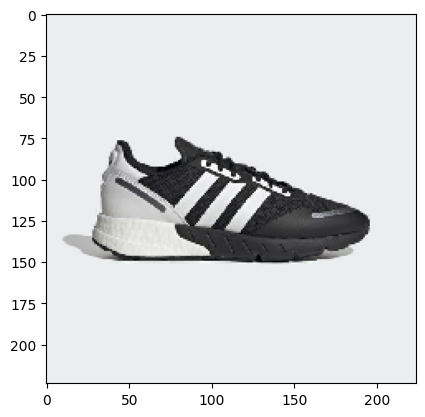

name:  datathon/zx_1k_boost_shoes
rating:  0.61014915


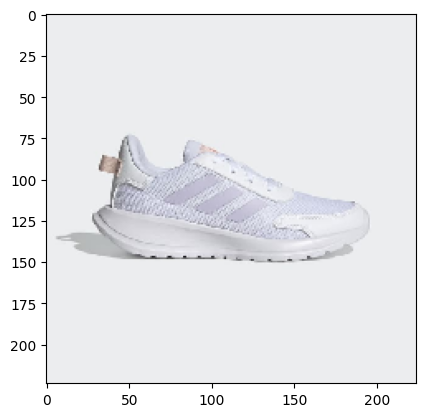

name:  datathon/tensor_run_shoes
rating:  0.60898256


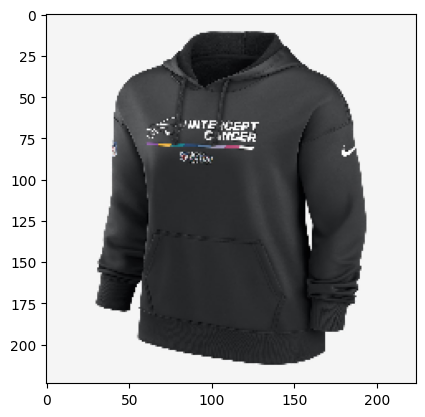

name:  datathon/nike_dri-fit_crucial_catch_(nfl_buffalo_bills)
rating:  0.6088676


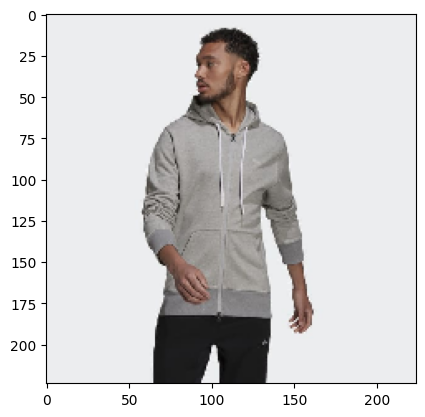

name:  datathon/adidas_sportswear_comfy_&_chill_full_zip_hoodie
rating:  0.6085146


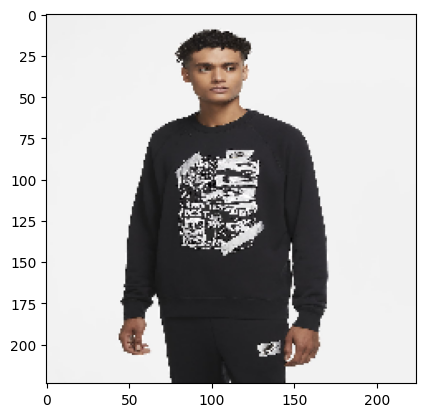

name:  datathon/nike_sportswear
rating:  0.60846853


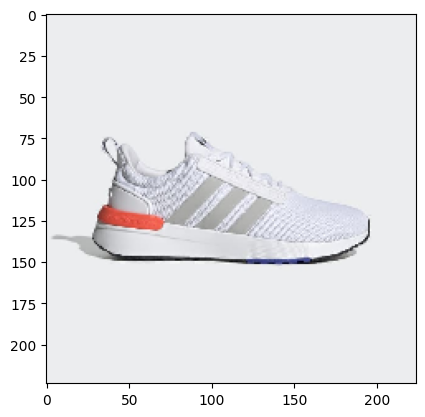

name:  datathon/racer_tr21_wide_shoes
rating:  0.60809433


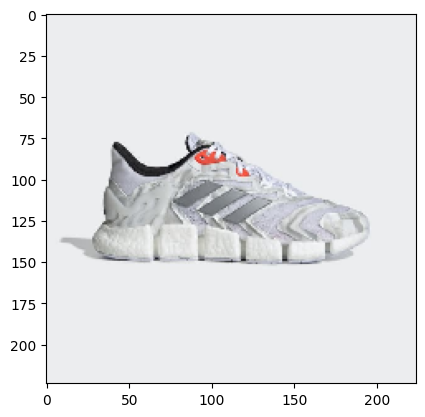

name:  datathon/climacool_vento_shoes
rating:  0.6079926


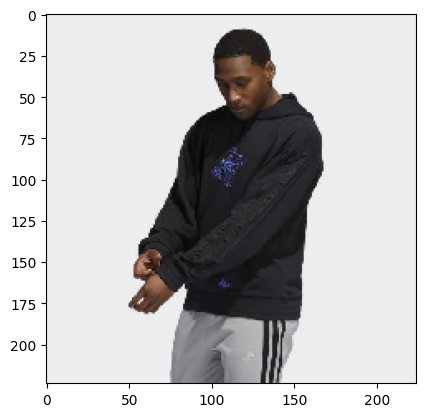

name:  datathon/lil_stripe_ignite_szn_hoodie
rating:  0.6078439


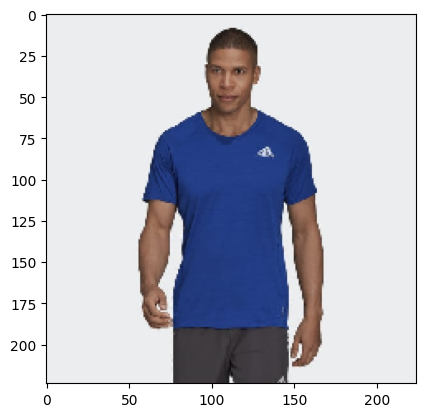

name:  datathon/runner_tee
rating:  0.60771376


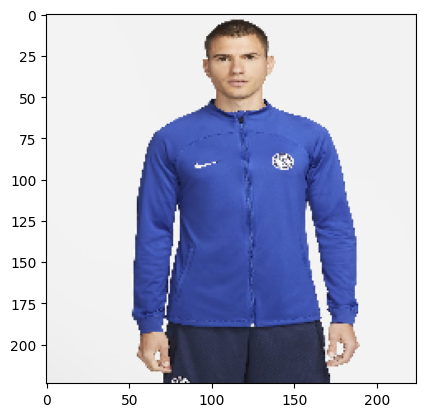

name:  datathon/chelsea_fc_strike
rating:  0.60759366


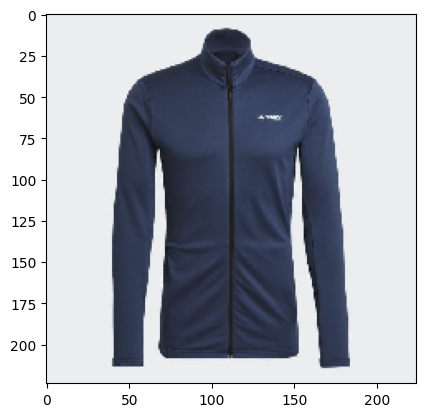

name:  datathon/terrex_multi_primegreen_full-zip_fleece_jacket
rating:  0.60722554


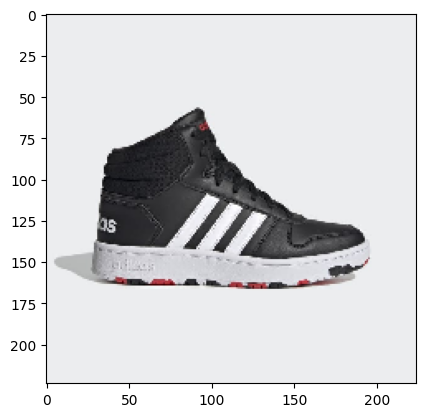

name:  datathon/hoops_2.0_mid_shoes
rating:  0.607052


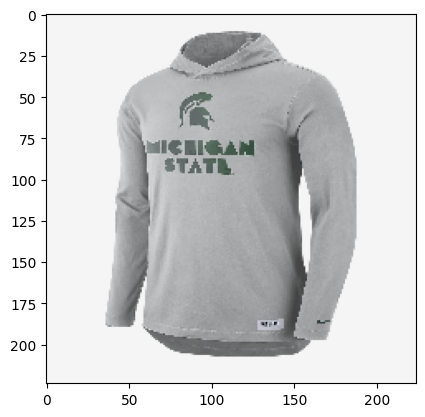

name:  datathon/nike_college_dri-fit_(michigan_state)
rating:  0.6069534


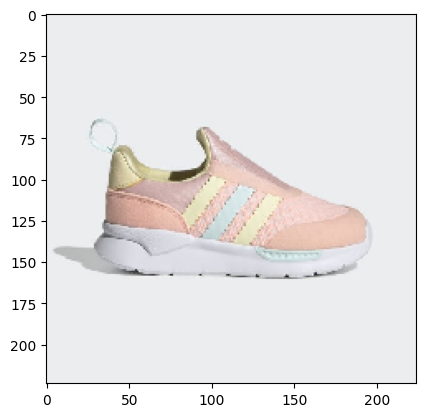

name:  datathon/zx_360_shoes
rating:  0.606895


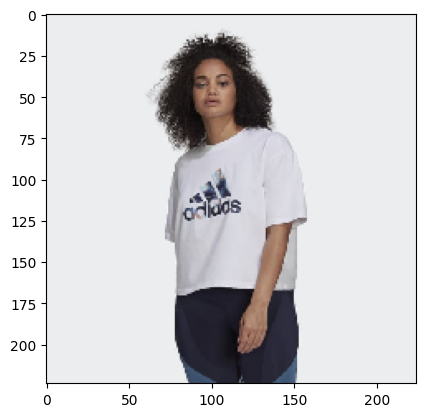

name:  datathon/adidas_x_zoe_saldana_crop_logo_tee_(plus_size)
rating:  0.606542


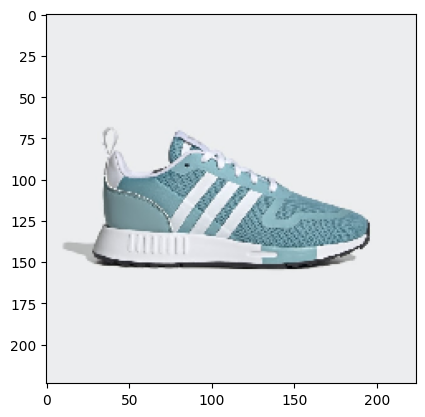

name:  datathon/multix_shoes
rating:  0.6065182


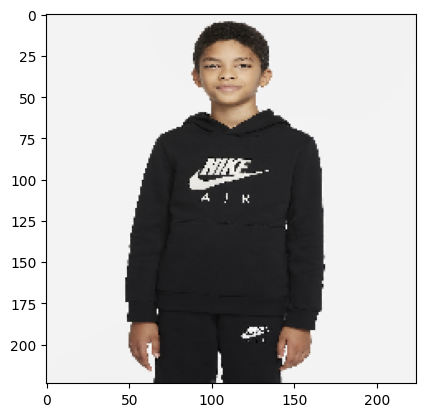

name:  datathon/nike_air
rating:  0.6063599


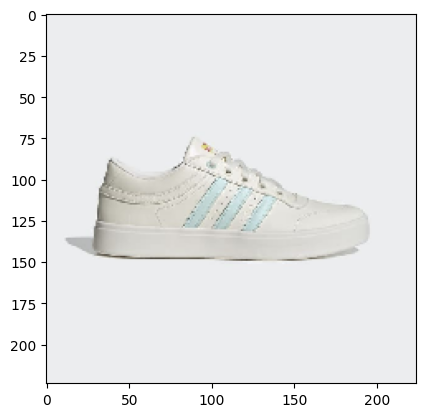

name:  datathon/bryony_shoes
rating:  0.6061354


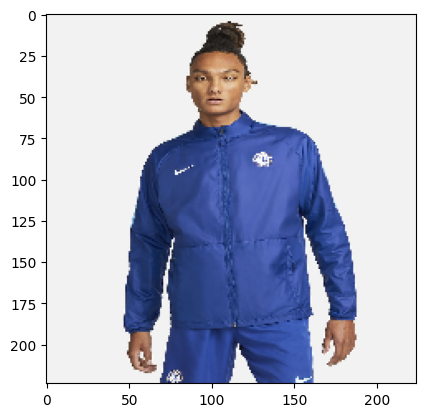

name:  datathon/chelsea_fc_repel_academy_awf
rating:  0.6051794


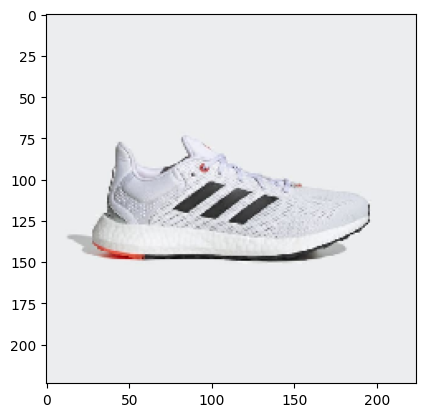

name:  datathon/pureboost_21_shoes
rating:  0.6044185


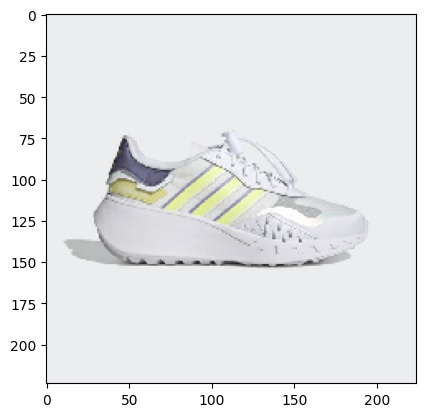

name:  datathon/choigo_shoes
rating:  0.6043828


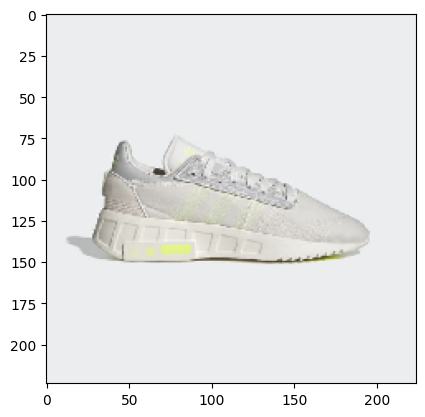

name:  datathon/geodiver_primeblue_shoes
rating:  0.6042923


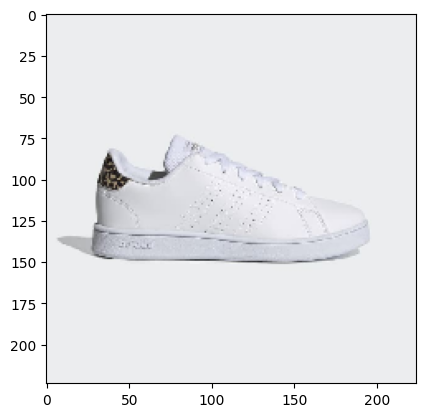

name:  datathon/advantage_shoes
rating:  0.60271204


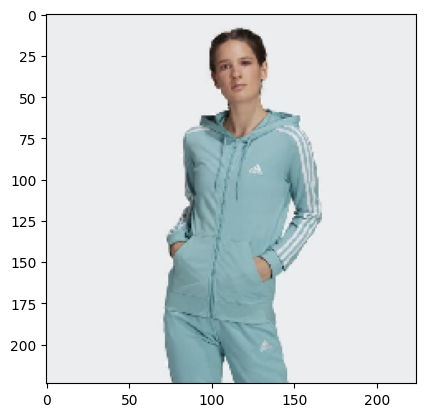

name:  datathon/essentials_3-stripes_full-zip_hoodie
rating:  0.602593


In [16]:
clf = linear_model.Ridge(alpha=0.01, fit_intercept  = True)
clf.fit(products_features, vector_cosine)
w = clf.coef_
b = clf.intercept_
ratings = products_features.dot(w) + b
top_indices = np.argsort(ratings)[::-1]

i = 0
showed_items = items
showed_items = [getID(item) for item in showed_items]
existed = len(showed_items)
while(len(showed_items) - existed != n_recommendations):
    name = getID(files[top_indices[i]])
    if name in showed_items:
        i+=1
        continue
    if os.path.exists(name + "_image_1.jpg"):
        filename = name + "_image_1.jpg"
    elif os.path.exists(name + "_image_1.png"):
        filename = name + "_image_1.png"
    else:
        filename = files[top_indices[i]]
    original = load_img(filename, target_size=(img_width, img_height))
    plt.imshow(original)
    plt.show()
    print("name: ", name)
    print("rating: ", ratings[top_indices[i]])
    i+=1
    showed_items.append(name)